
# **Music and Speech classification using CNN**



**Notebook 2 Overview:**

**1. Loading required packages**

**2. Data loading and preparation of loaders for CNN training**

*    Load prepocessed data (Notebook 1) from github
*    Create train & test loaders

**3.  CNN training**
*    Define and train different Convolutional Neural Networks (CNN)
*    Gridsearch for optimal learning rate and epochs, save best model

**4. Inference**



*   Load and prepare “unseen” validation audio files
*   Load best CNN model
*   Classification of validation files



# **1. Load required packages and libraries**

In [1]:
import os
import torchaudio
from torchvision import transforms
import torch
from google.colab import drive
import matplotlib.pyplot as plt
from torchvision.transforms import Compose
import torchaudio.transforms as T
import IPython.display as ipd
import pickle
from google.colab import files
import torch.optim as optim

from tqdm import tqdm
import torch.nn as nn
import torch.nn.functional as F
import seaborn as sns
from torch.utils.data import Dataset, DataLoader, random_split
from itertools import count, product

import urllib.request
from urllib.request import urlopen
from urllib.parse import urljoin
import requests
from io import BytesIO

import numpy as np

from sklearn.metrics import confusion_matrix,confusion_matrix,classification_report
from sklearn.model_selection import ParameterGrid

import random
import copy

# Set random seed for Python's built-in random module
random_seed = 42
random.seed(random_seed)

# Set random seed for NumPy
np.random.seed(random_seed)

# Set random seed for PyTorch
torch.manual_seed(random_seed)
torch.cuda.manual_seed_all(random_seed)  # If using GPUs

# Additional steps for reproducibility in CUDA operations (if using GPUs)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


# **2. Data loading and preparation of loaders for CNN**


*   Load the data (spectrograms, patches, labels, audio-paths from notebook 1) saved on the GitHub reporsitory.
*   Plot the data to check.
*   Create Train and Test loaders with saved patches, labels, audio-paths, spectrograms






In [2]:
# choose one of the .pkl files with spectrograms, patches, labels and audio_paths saved on the GiHub repository:

url = "https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/saved_melspectrograms_patches(32_overlap)_labels_paths.pkl"
#url = "https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/saved_melspectrograms_patches(no_overlap)_labels_paths.pkl"
#url = "https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/saved_spectrograms_patches(32_overlap)_labels_paths.pkl"
#url = "https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/saved_spectrograms_patches(no_overlap)_labels_paths.pkl"

file = urlopen(url)
loaded_data = pickle.load(file)

# Access the loaded data
spectrograms = loaded_data['spectrograms']
labels = loaded_data['labels']
patches = loaded_data['patches']
audio_paths = loaded_data['audio_paths']



*   Print few Patches to check if they look ok




Patches shape: torch.Size([384, 1, 128, 64])
Labels shape: torch.Size([384])
Spectrograms shape: torch.Size([128, 1, 128, 128])
Playing audio for: music_wav/bagpipe.wav


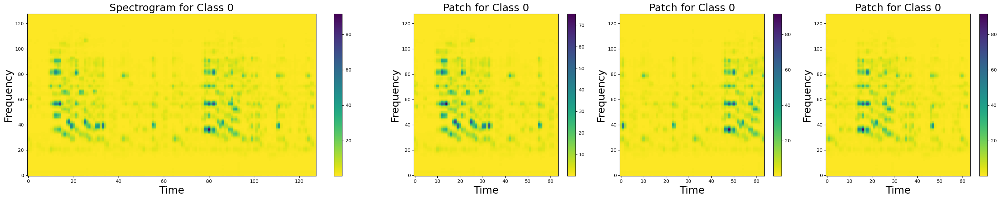

Playing audio for: music_wav/classical2.wav


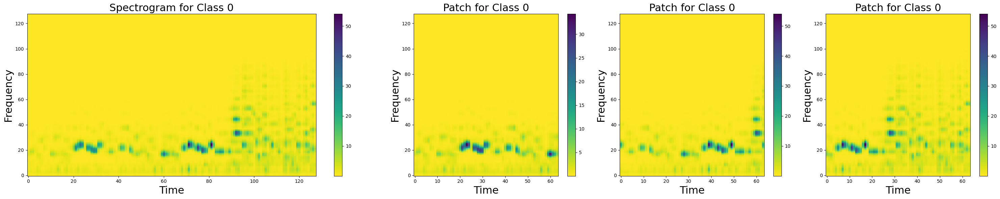

Playing audio for: speech_wav/acomic2.wav


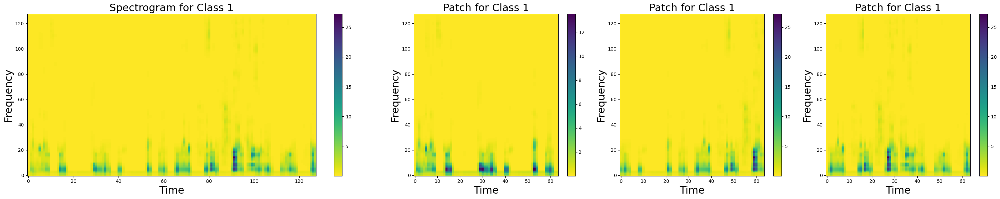

Playing audio for: speech_wav/voices.wav


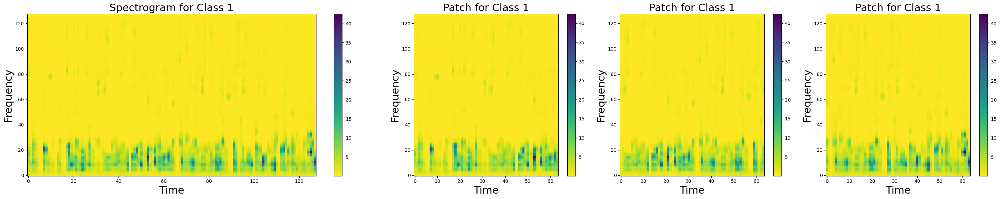

In [3]:
# Check that loaded data looks ok:
print(f'Patches shape: {patches.shape}')
print(f'Labels shape: {labels.shape}')
print(f'Spectrograms shape: {spectrograms.shape}')


# Select a few indices for visualization (for this code should be called only as positive numbers)
visualize_indices = (0, 15, 65, 127)
width_ratios = (2,1,1,1)

# Plot the selected spectrograms and corresponding patches
for idx in visualize_indices:
    # Play audio
    audio_path = audio_paths[idx*3]
    last_two_hierarchies = "/".join(audio_path.split("/")[-2:])  # Assuming "/" is the path separator, extracts class and filename
    print(f"Playing audio for: {last_two_hierarchies}") #play only the original audio corresponding to one of the patches( the first patch)
    display(ipd.Audio(audio_path))

    # Plot spectrogram and patches in the same row
    fig, axes = plt.subplots(1, 4, figsize=(30, 6), gridspec_kw={'width_ratios': width_ratios})

    # Plot spectrogram
    axes[0].imshow(spectrograms[idx][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower')
    axes[0].set_title(f'Spectrogram for Class {labels[idx*3].item()}', fontsize= 22)
    axes[0].set_xlabel('Time',fontsize= 22)
    axes[0].set_ylabel('Frequency',fontsize= 22)
    axes[0].grid(False)
    plt.colorbar(axes[0].imshow(spectrograms[idx][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower'), ax=axes[0])

    # Plot patches and play audio (indices of the patches are visualize indices of spectrograms * 3 and + 0, +1, + 2,for the 3 patches)
    for i in range(3):
        axes[i+1].imshow(patches[idx*3+i][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower')
        axes[i+1].set_title(f'Patch for Class {labels[idx*3+i].item()}',fontsize= 22)
        axes[i+1].set_xlabel('Time',fontsize= 22)
        axes[i+1].set_ylabel('Frequency',fontsize= 22)
        axes[i+1].grid(False)
        plt.colorbar(axes[i+1].imshow(patches[idx*3+i][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower'), ax=axes[i+1])



    plt.tight_layout()
    plt.show()





### **Create Train and Test loaders with saved patches, labels, audio-paths, spectrograms**



In [4]:
# split the data set and create the loaders:

# use Dataset class provided by the torch.utils.data module, used as a base class for creating custom datasets in PyTorch.
# class: defines a custom dataset (AudioDataset) for handling audio data. Takes three parameters during initialization: patches, labels, and audio_paths.

class AudioDataset(Dataset):
    def __init__(self, patches, labels, audio_paths):
        self.patches = patches
        self.labels = labels
        self.audio_paths = audio_paths

# returns the length of the dataset = the number of patches.
    def __len__(self):
        return len(self.patches)

# retrieves an item from the dataset based on its index (idx)
# returns a tuple : audio patch, its label, and its audio path.

    def __getitem__(self, idx):
        return self.patches[idx], self.labels[idx], self.audio_paths[idx]

# Set size of training and validation sets (80 % train, 20 % test)

train_size = int(0.8 * len(patches))
val_size = len(patches) - train_size

# Split the dataset into training and validation with random_split function from PyTorch.
# takes tuples (patches, labels, and audio paths) and the list with the sizes of the training and validation sets.

train_dataset, val_dataset = random_split(list(zip(patches, labels, audio_paths)), [train_size, val_size])


# create the loaders- using the Dataloader class from PyTorch
batch_size = 32

train_loader = DataLoader(dataset=AudioDataset(*zip(*train_dataset)), batch_size=batch_size, shuffle=True)
test_loader = DataLoader(dataset=AudioDataset(*zip(*val_dataset)), batch_size=batch_size, shuffle=False)

# strore data loaders as dictionaries
loaders = {'train': train_loader, 'test': test_loader}

# Create a copy of the loaders for the cnn to call in each cnn. We will initiate the cnn with loaders_cnn and not with loaders
loaders_cnn = copy.deepcopy(loaders)

# Check shape of the loaders:
#Assuming loaders is a dictionary containing the data loaders for train and test sets

# Check the shape of the first batch in the training loader
for patches, labels, audio_paths in loaders['train']:
    print("Patches shape (first batch in training loader):", patches.shape)
    print("Labels shape (training loader):", labels.shape)
    print("Audio paths (first batch in training loader):", audio_paths)
    break  # Break after printing the first batch to avoid printing for every batch

# Check the shape of the first batch in the test loader
for patches, labels, audio_paths in loaders['test']:
    print("Patches shape (first batch in test loader):", patches.shape)
    print("Labels shape (test loader):", labels.shape)
    print("Audio paths (first batch in test loader):", audio_paths)
    break  # Break after printing the first batch to avoid printing for every batch

Patches shape (first batch in training loader): torch.Size([32, 1, 128, 64])
Labels shape (training loader): torch.Size([32])
Audio paths (first batch in training loader): ('https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/music_wav/mingus1.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/music_wav/canonaki.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/music_wav/canonaki.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/music_wav/tony.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/speech_wav/danie.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/music_wav/classical1.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/speech_wav/fire.wav', 'https://github.com/Rin

In [5]:
# Assuming loaders is a dictionary containing DataLoader objects
for i, (images, labels, audio_paths) in enumerate(loaders['test']):
    print(f"Batch {i + 1} - Images: {images.shape}, Labels: {labels}, Audio Paths: {audio_paths}")

    # Print a few examples from the batch
    for j in range(min(5, len(images))):  # Print details for up to 5 examples in each batch
        print(f"Example {j + 1}: Label - {labels[j].item()}, Audio Path - {audio_paths[j]}")

    # Break the loop after a few batches for brevity
    if i == 2:
        break

Batch 1 - Images: torch.Size([32, 1, 128, 64]), Labels: tensor([0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0,
        1, 1, 1, 0, 1, 0, 0, 0]), Audio Paths: ('https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/music_wav/copland.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/music_wav/narch.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/music_wav/hendrix.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/music_wav/copland2.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/speech_wav/teachers.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/music_wav/ipanema.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/music_wav/classical2.wav', 'https:

#**3. Define and train different CNNs**

### CNN **3 Convolutional layers**, 2 linear layers, 2 output layers, Cross-Entropy loss. For **non overlapping patches** (3 patches of 128H x 42W, with no overlap)

In [ ]:
#load the loaders from the loaders_backup to use test in different CNNs.


loaders_cnn = copy.deepcopy(loaders) # we get loaders_cnn from the saved original loaders that we do not pass to the Cnn

NameError: name 'copy' is not defined

In [ ]:
#Hyperparameters:
num_epochs = 15
learning_rate = 0.008
#learning_rate = 0.01

# define the convolutional network:
class CNN(nn.Module):
    def __init__(self, loaders_cnn):
        super(CNN, self).__init__()
        self.loaders_cnn = loaders_cnn
        self.conv1 = nn.Conv2d(1, 16, 3, padding=1) #parameters: input channels (=1), output channels (=16), kernel size
        self.conv2 = nn.Conv2d(16, 32, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 32, 3, stride=2, padding=1)
        self.fc1 = nn.Linear(32*32*11, 32) #the output of the conv3 layer is 32(batch size), 32(channels), 32(height), 16(width). So input needs to be 32*32*16 (CxHxW = number of features), and output = 32
        self.fc2 = nn.Linear(32, 2) #input: 32 features, output: 10 features #maybe put 2 as output, b/c we want a binary output (speech/music)

    def forward(self, x):
        x = F.relu(self.conv1(x))  #
        #print(x.size()) #32_overlap: ([32, 16, 128, 42]) (batch size, channels, height, width)
        x = F.relu(self.conv2(x))  #
        #print(x.size()) #32_overlap: (32, 32, 64, 21)
        x = F.relu(self.conv3(x))  #
        # Print the size of the tensor at this point
        #print(x.size()) #i32_overlap: 32, 32, 32, 11,
        x = x.view(-1, 32*32*11) # flatten 32*32*16 -> Purpose is to flatten the 4d tensor to 1d, so it can be fed into FC layer
        #print(x.size()) #no_overlap: 22, 16384]
        x = F.relu(self.fc1(x))
        #print(x.size()) # 22, 32
        output = self.fc2(x)            # no activation, note: for inference we can apply torch.argmax: the class predicted is the one with higher logits values, no need to apply Softmayx if we use nn.CrossEntropyLoss()
        return output, x

cnn = CNN(loaders_cnn)

torch.Size([32, 16, 128, 42])
torch.Size([32, 32, 64, 21])
torch.Size([32, 32, 32, 11])
torch.Size([22, 16384])
torch.Size([22, 32])

# define loss
loss_func = nn.CrossEntropyLoss()
loss_func

# define optimizer
#from torch import optim
optimizer = optim.Adam(cnn.parameters(), lr = learning_rate)
optimizer




NameError: name 'nn' is not defined

In [ ]:
def train_and_plot_2 (num_epochs, cnn, loaders_cnn):
    train_losses = []
    test_losses = []
    accuracies = []
    cnn.train()

    confusion_matrices = []
    classes = ["music", "speech"]  # Set your class labels for confusion matrix display

    for epoch in range(num_epochs): # go through every epoch
        # Training
        train_loss = 0.0
        for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['train']): # go through every patch in the batch, i.e. usually 32 patches per batch
            b_x, b_y = patches, labels
            output = cnn(b_x)[0]
            loss = loss_func(output, b_y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        avg_train_loss = train_loss / len(loaders_cnn['train']) # average loss ("difference of prediction and true label") per patch in a specific epoch
        train_losses.append(avg_train_loss)

        # Testing
        cnn.eval()
        test_loss = 0.0
        correct = 0
        total = 0
        correct_info = []
        incorrect_info = []

        y_true_epoch = []
        y_pred_epoch = []

        with torch.no_grad():
            for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['test']):
                b_x, b_y, b_a = patches, labels, audio_paths

                outputs, _ = cnn(b_x) # gives a tensor output with the probabilities of belonging to class 0 (music) or class 1 (speech)
                loss = loss_func(outputs, b_y)
                test_loss += loss.item()

                _, predicted = torch.max(outputs.data, 1) # takes the tensor called "output" and gives the index of the maximal probability (index 0 for music, index 1 for speech)
                total += b_y.size(0)
                correct += (predicted == b_y).sum().item() #adds 1 to the "correct" counter if predicted label equals true label

                y_true_epoch.extend(b_y.tolist()) # why do we need them?
                y_pred_epoch.extend(predicted.tolist())

                # Check for correct and incorrect predictions
                correct_mask = predicted == b_y
                cumulative_batch_size = batch_size * i #here we already multiply by current iteration, so below not necessary anymore

                correct_info.extend([(cumulative_batch_size + j, b_x[j], predicted[j].item(), b_y[j].item(), b_a[j]) for j, is_correct in enumerate(correct_mask) if is_correct])
                incorrect_info.extend([(cumulative_batch_size + j, b_x[j], predicted[j].item(), b_y[j].item(), b_a[j]) for j, is_correct in enumerate(correct_mask) if not is_correct])

                # the info will save: the index of the loader (patch), the patch, the predicted label, the original label, the file path

        avg_test_loss = test_loss / len(loaders_cnn['test'])
        test_losses.append(avg_test_loss)

        accuracy = 100 * correct / total #percentage of correct predictions over all patches loaded
        accuracies.append(accuracy)

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}, Accuracy in test set: {accuracy:.2f}%")

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(num_epochs),train_losses, label='Train Loss')
    plt.plot(range(num_epochs),test_losses, label='Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Plotting
    plt.plot(range(num_epochs), accuracies, label='val-accuracy in test set')
    plt.title('val-accuracy in test set')
    plt.xlabel('Epoch')
    plt.ylabel('accuracy')
    plt.show()

    # Compute and append confusion matrix for the last epoch
    if epoch == num_epochs - 1:
        confusion_matrices.append(confusion_matrix(y_true_epoch, y_pred_epoch)) # list of true labels and list of predicted labels

    # Plot the confusion matrix for the last epoch
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrices[-1], annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    print("Classification Report-Test:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return correct_info, incorrect_info

# Then you can call the train_and_plot function
correct_info, incorrect_info = train_and_plot_2(num_epochs, cnn, loaders_cnn)


# Note: here we have a cnn with 2 outputs...for inference we would need to apply soft max to convert logits into probabilities of belonging to a specific class.

In [ ]:
from itertools import count
print(f'number of incorrect predictions : {len(incorrect_info)}'), print(f'number of correct predictions :{len(correct_info)}')

# Count the frequency of 1 and 0 in the second position
count_1 = sum(1 for prediction in incorrect_info if prediction[2] == 1)
count_0 = sum(1 for prediction in incorrect_info if prediction[2] == 0)


# Output the results
print("Frequency of Music (0) predicted wrongly as Speech (1):", count_1)

print("Frequency of Speech (1) predicted wrongly as  Music (0):", count_0)


In [ ]:
# saves indices of incorrect and correctly predited patches
patches_correct = [item[0] for item in correct_info]
patches_incorrect = [item[0] for item in incorrect_info]

#print(patches_correct)
print(f' incorrect_patches_indexes= {patches_incorrect}')

# Assuming patches_incorrect contains indices

for i, info in enumerate(incorrect_info):
    print(i)
    #print(info)
    print(f"Patch number/index: {info[0]}")
    plt.figure(figsize=(6, 3))
    plt.imshow(info[1][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower')
    plt.title(f'Patch for file {info[4]}', fontsize= 10)
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.colorbar(format='%+2.0f dB')
    plt.show()
    print(f"Patch is (0=music, 1=speech): {info[3]}")
    print(f"Patch was predicted as (0=music, 1=speech): {info[2]}")
    print(f"Playing audio for: {info[4]}")
    display(ipd.Audio(info[4]))


### CNN **3 Convolutional layers** and 2 linear layers, 2 output layers, Cross-Entropy loss, for **overlapping patches** (3 patches of 128H x 64W, with 32 W overlap)





Loss goes down very fast in just 1-4 epochs, maybe decrease learning rate, check grid function, early stopping rule
Hyperparameter checking

In [ ]:
#load the loaders from the loaders_backup to use test in different CNNs.

loaders_cnn = copy.deepcopy(loaders) # we get loaders_cnn from the saved original loaders that we do not pass to the Cnn

In [ ]:
#Hyperparameters:
num_epochs = 15
learning_rate = 0.008
#learning_rate = 0.01
# define the convolutional network:
class CNN(nn.Module):
    def __init__(self, loaders_cnn):
        super(CNN, self).__init__()
        self.loaders_cnn = loaders_cnn
        self.conv1 = nn.Conv2d(1, 16, 3, padding=1) #parameters: input channels (=1), output channels (=16), kernel size
        self.conv2 = nn.Conv2d(16, 32, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 32, 3, stride=2, padding=1)
        self.fc1 = nn.Linear(32*32*16, 32) #the size was not right, the output of the conv3 layer is 32(batch size), 32(channels), 32(height), 16(width). So input needs to be 32*32*16 (CxHxW = number of features), and output = 32
        self.fc2 = nn.Linear(32, 2) #input: 32 features, output: 10 features #maybe put 2 as output, b/c we want a binary output (speech/music)

    def forward(self, x):
        x = F.relu(self.conv1(x))  #
        #print(x.size()) #32_overlap: (32, 16, 128, 64) (batch size, channels, height, width), for no_overlap: ..42
        x = F.relu(self.conv2(x))  #
        #print(x.size()) #32_overlap: (32, 32, 64, 32), for no_overlap: ...21
        x = F.relu(self.conv3(x))  #
        # Print the size of the tensor at this point
        #print(x.size()) #i32_overlap: 32, 32, 32, 16, for no_overlap: ...11
        x = x.view(-1, 32*32*16) # flatten 32*32*16 -> Purpose is to flatten the 4d tensor to 1d, so it can be fed into FC layer
        #print(x.size()) #32_overlap: 32, 16384, no_overlap: 22, 16384
        x = F.relu(self.fc1(x))
        #print(x.size()) #32_overlap: 32, 32 no_overlap: 22, 32
        output = self.fc2(x)            # no activation, we will use cross-entropy loss with logits # maybe use softmax?
        return output, x

cnn = CNN(loaders_cnn)

# define loss
loss_func = nn.CrossEntropyLoss()
loss_func

# define optimizer
#from torch import optim
optimizer = optim.Adam(cnn.parameters(), lr = learning_rate)
optimizer




 **Execute the learning**

Version including list of correct and incorrect predictions

In [ ]:


def train_and_plot_2 (num_epochs, cnn, loaders_cnn):
    train_losses = []
    test_losses = []
    accuracies = []
    cnn.train()

    confusion_matrices = []
    classes = ["music", "speech"]  # Set your class labels for confusion matrix display

    for epoch in range(num_epochs): # go through every epoch
        # Training
        train_loss = 0.0
        for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['train']): # go through every patch in the batch, i.e. usually 32 patches per batch
            b_x, b_y = patches, labels
            output = cnn(b_x)[0]
            loss = loss_func(output, b_y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        avg_train_loss = train_loss / len(loaders_cnn['train']) # average loss ("difference of prediction and true label") per patch in a specific epoch
        train_losses.append(avg_train_loss)

        # Testing
        cnn.eval()
        test_loss = 0.0
        correct = 0
        total = 0
        correct_info = []
        incorrect_info = []

        y_true_epoch = []
        y_pred_epoch = []

        with torch.no_grad():
            for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['test']):
                b_x, b_y, b_a = patches, labels, audio_paths

                outputs, _ = cnn(b_x) # gives a tensor output with the probabilities of belonging to class 0 (music) or class 1 (speech)
                loss = loss_func(outputs, b_y)
                test_loss += loss.item()

                _, predicted = torch.max(outputs.data, 1) # takes the tensor called "output" and gives the index of the maximal probability (index 0 for music, index 1 for speech)
                total += b_y.size(0)
                correct += (predicted == b_y).sum().item() #adds 1 to the "correct" counter if predicted label equals true label

                y_true_epoch.extend(b_y.tolist()) # why do we need them?
                y_pred_epoch.extend(predicted.tolist())

                # Check for correct and incorrect predictions
                correct_mask = predicted == b_y
                cumulative_batch_size = batch_size * i #here we already multiply by current iteration, so below not necessary anymore

                correct_info.extend([(cumulative_batch_size + j, b_x[j], predicted[j].item(), b_y[j].item(), b_a[j]) for j, is_correct in enumerate(correct_mask) if is_correct])
                incorrect_info.extend([(cumulative_batch_size + j, b_x[j], predicted[j].item(), b_y[j].item(), b_a[j]) for j, is_correct in enumerate(correct_mask) if not is_correct])

                # the info will save: the index of the loader (patch), the patch, the predicted label, the original label, the file path

        avg_test_loss = test_loss / len(loaders_cnn['test'])
        test_losses.append(avg_test_loss)

        accuracy = 100 * correct / total #percentage of correct predictions over all patches loaded
        accuracies.append(accuracy)

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}, Accuracy in test set: {accuracy:.2f}%")

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(test_losses, label='Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Plotting
    plt.plot(range(num_epochs), accuracies, label='val-accuracy in test set')
    plt.title('val-accuracy in test set')
    plt.xlabel('Epoch')
    plt.ylabel('accuracy')
    plt.show()

    # Compute and append confusion matrix for the last epoch
    if epoch == num_epochs - 1:
        confusion_matrices.append(confusion_matrix(y_true_epoch, y_pred_epoch)) # list of true labels and list of predicted labels

    # Plot the confusion matrix for the last epoch
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrices[-1], annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    print("Classification Report-Test:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return correct_info, incorrect_info

# Then you can call the train_and_plot function
correct_info, incorrect_info = train_and_plot_2(num_epochs, cnn, loaders_cnn)




In [ ]:
# the correct and incorrect info will save this data as a list: the index of the loader (patch), the patch, the predicted label, the original label, the file path

# Print some correct and incorrect information
#print("Examples of Correct Predictions (indx, Pred, True, file_path):")
#print(correct_info[:5])  # Print the first 5 correct predictions
#print(f"Playing audio for: {audio_paths[correct_info]}")
#display(ipd.Audio(audio_paths[idx]))
#print(" All Incorrect Predictions (indx, Patches, Pred, True, file_path):")
#print(incorrect_info)  # Print all incorrect predictions


In [ ]:
print(f'number of incorrect predictions : {len(incorrect_info)}'), print(f'number of correct predictions :{len(correct_info)}')

# Count the frequency of 1 and 0 in the second position
count_1 = sum(1 for prediction in incorrect_info if prediction[2] == 1)
count_0 = sum(1 for prediction in incorrect_info if prediction[2] == 0)

# Output the results
print("Frequency of Music (0) predicted wrongly as Speech (1):", count_1)

print("Frequency of Speech (1) predicted wrongly as  Music (0):", count_0)

NameError: name 'incorrect_info' is not defined

In [ ]:
# saves indices of incorrect and correctly predited patches
patches_correct = [item[0] for item in correct_info]
patches_incorrect = [item[0] for item in incorrect_info]

#print(patches_correct)
print(f' incorrect_patches_indexes= {patches_incorrect}')

# Assuming patches_incorrect contains indices

for i, info in enumerate(incorrect_info):
    print(i)
    #print(info)
    print(f"Patch number/index: {info[0]}")
    plt.figure(figsize=(6, 3))
    plt.imshow(info[1][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower')
    audio_path = info[4]
    last_two_hierarchies = "/".join(audio_path.split("/")[-2:])  # Assuming "/" is the path separator, extracts class and filename
    plt.title(f'Patch for file {last_two_hierarchies}', fontsize= 10)
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.colorbar(format='%+2.0f dB')
    plt.show()
    print(f"Patch is (0=music, 1=speech): {info[3]}")
    print(f"Patch was predicted as (0=music, 1=speech): {info[2]}")
    print(f"Playing audio for: {last_two_hierarchies}")
    display(ipd.Audio(info[4]))


### CNN **4 Convolutional layers**, 1 maxpooling, 2 linear layers, 2 output layers, Cross-Entropy loss,  for  **non overlapping patches** (3 patches, 128H, 42W, no overlap)

In [ ]:
#load the loaders from the loaders_backup to use test in different CNNs.


loaders_cnn = copy.deepcopy(loaders) # we get loaders_cnn from the saved original loaders that we do not pass to the Cnn

In [ ]:
#Hyperparameters:
num_epochs = 15
#learning_rate = 0.01
learning_rate =0.08

In [ ]:
# CNN for no overlapping patches

# Define the CNN
class CNN(nn.Module):
    def __init__(self, loaders_cnn):
        super(CNN, self).__init__()
        self.loaders_cnn = loaders_cnn
        self.conv1 = nn.Conv2d(1, 16, 3, padding=1) #parameters: input channels (=1), output channels (=16), kernel size =3x3
        self.conv2 = nn.Conv2d(16, 32, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 32, 3, stride=2, padding=1)
        self.conv4 = nn.Conv2d(32, 64, 3, stride=2, padding=1)  # New convolutional layer
        self.fc1 = nn.Linear(64 * 8 * 3, 32)  # the output of the conv4 pooled layer is [32, 64, 8, 3], 32(batch size), 64(channels), 8(height), 3(width). So input needs to be 64*8*3, output
        self.fc2 = nn.Linear(32, 2)



    def forward(self, x):
      x = F.relu(self.conv1(x))
      #print(f' size conv1 {x.size()}') # size conv1 torch.Size([[32, 16, 128, 42])
      x = F.relu(self.conv2(x))
      #print(f' size conv2 {x.size()}') # size conv2 torch.Size([32, 32, 64, 21])
      x = F.relu(self.conv3(x))
      #print(f' size conv3 {x.size()}') #size conv3 torch.Size([[32, 32, 32, 11])
      x = F.relu(self.conv4(x))
      #print(f' size conv4 {x.size()}') # size conv4 torch.Size([32, 64, 16, 6])
      x = F.max_pool2d(x, 2)
      #print(f' size conv4 after pool2d {x.size()}')  # Check the size after pooling # size conv4 after pool2d torch.Size([32, 64, 8, 3])
      x = x.view(-1, 64 * 8 * 3)
      #print(f' size after view {x.size()}') # size after view torch.Size([24, 2048])
      x = F.relu(self.fc1(x))
      #print(f' size fc1 {x.size()}') #size fc1 torch.Size([24, 32])
      output = self.fc2(x)
      #print(f' size fc2 {x.size()}') # size fc2 torch.Size([24, 32])
      return output, x

cnn = CNN(loaders_cnn)

# define loss
loss_func = nn.CrossEntropyLoss()
loss_func

# define optimizer
from torch import optim
optimizer = optim.Adam(cnn.parameters(), lr = learning_rate)
optimizer



In [ ]:
def train_and_plot_2 (num_epochs, cnn, loaders_cnn):
    train_losses = []
    test_losses = []
    accuracies = []
    cnn.train()

    confusion_matrices = []
    classes = ["music", "speech"]  # Set your class labels for confusion matrix display

    for epoch in range(num_epochs): # go through every epoch
        # Training
        train_loss = 0.0
        for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['train']): # go through every patch in the batch, i.e. usually 32 patches per batch
            b_x, b_y = patches, labels
            output = cnn(b_x)[0]
            loss = loss_func(output, b_y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        avg_train_loss = train_loss / len(loaders_cnn['train']) # average loss ("difference of prediction and true label") per patch in a specific epoch
        train_losses.append(avg_train_loss)

        # Testing
        cnn.eval()
        test_loss = 0.0
        correct = 0
        total = 0
        correct_info = []
        incorrect_info = []

        y_true_epoch = []
        y_pred_epoch = []

        with torch.no_grad():
            for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['test']):
                b_x, b_y, b_a = patches, labels, audio_paths

                outputs, _ = cnn(b_x) # gives a tensor output with the probabilities of belonging to class 0 (music) or class 1 (speech)
                loss = loss_func(outputs, b_y)
                test_loss += loss.item()

                _, predicted = torch.max(outputs.data, 1) # takes the tensor called "output" and gives the index of the maximal probability (index 0 for music, index 1 for speech)
                total += b_y.size(0)
                correct += (predicted == b_y).sum().item() #adds 1 to the "correct" counter if predicted label equals true label

                y_true_epoch.extend(b_y.tolist()) # why do we need them?
                y_pred_epoch.extend(predicted.tolist())

                # Check for correct and incorrect predictions
                correct_mask = predicted == b_y
                cumulative_batch_size = batch_size * i #here we already multiply by current iteration, so below not necessary anymore

                correct_info.extend([(cumulative_batch_size + j, b_x[j], predicted[j].item(), b_y[j].item(), b_a[j]) for j, is_correct in enumerate(correct_mask) if is_correct])
                incorrect_info.extend([(cumulative_batch_size + j, b_x[j], predicted[j].item(), b_y[j].item(), b_a[j]) for j, is_correct in enumerate(correct_mask) if not is_correct])

                # the info will save: the index of the loader (patch), the patch, the predicted label, the original label, the file path

        avg_test_loss = test_loss / len(loaders_cnn['test'])
        test_losses.append(avg_test_loss)

        accuracy = 100 * correct / total #percentage of correct predictions over all patches loaded
        accuracies.append(accuracy)

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}, Accuracy in test set: {accuracy:.2f}%")

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(num_epochs),train_losses, label='Train Loss')
    plt.plot(range(num_epochs),test_losses, label='Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Plotting
    plt.plot(range(num_epochs), accuracies, label='val-accuracy in test set')
    plt.title('val-accuracy in test set')
    plt.xlabel('Epoch')
    plt.ylabel('accuracy')
    plt.show()

    # Compute and append confusion matrix for the last epoch
    if epoch == num_epochs - 1:
        confusion_matrices.append(confusion_matrix(y_true_epoch, y_pred_epoch)) # list of true labels and list of predicted labels

    # Plot the confusion matrix for the last epoch
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrices[-1], annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    print("Classification Report-Test:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return correct_info, incorrect_info

# Then you can call the train_and_plot function
correct_info, incorrect_info = train_and_plot_2(num_epochs, cnn, loaders_cnn)




In [ ]:
from itertools import count
print(f'number of incorrect predictions : {len(incorrect_info)}'), print(f'number of correct predictions :{len(correct_info)}')


# Count the frequency of 1 and 0 in the second position
count_1 = sum(1 for prediction in incorrect_info if prediction[2] == 1)
count_0 = sum(1 for prediction in incorrect_info if prediction[2] == 0)

# Output the results
print("Frequency of Music (0) predicted wrongly as Speech (1):", count_1)

print("Frequency of Speech (1) predicted wrongly as  Music (0):", count_0)



In [ ]:
# saves indices of incorrect and correctly predited patches
patches_correct = [item[0] for item in correct_info]
patches_incorrect = [item[0] for item in incorrect_info]

#print(patches_correct)
print(patches_incorrect)

# Assuming patches_incorrect contains indices

for i, info in enumerate(incorrect_info):
    print(i)
    #print(info)
    print(f"Patch number/index: {info[0]}")
    plt.figure(figsize=(6, 3))
    plt.imshow(info[1][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower')
    audio_path = info[4]
    last_two_hierarchies = "/".join(audio_path.split("/")[-2:])  # Assuming "/" is the path separator, extracts class and filename
    plt.title(f'Patch for file {last_two_hierarchies}', fontsize= 10)
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.colorbar(format='%+2.0f dB')
    plt.show()
    print(f"Patch is (0=music, 1=speech): {info[3]}")
    print(f"Patch was predicted as (0=music, 1=speech): {info[2]}")
    print(f"Playing audio for: {last_two_hierarchies}")
    display(ipd.Audio(info[4]))


NameError: name 'correct_info' is not defined

### CNN **4 Convolutional layers**, 1 maxpooling, 2 linear layers, 2 output layers, Cross-Entropy loss for **overlapping patches** (3 patches of 128H x 64W, with 32 W overlap)


In [ ]:
#load the loaders from the loaders_backup to use test in different CNNs.


loaders_cnn = copy.deepcopy(loaders) # we get loaders_cnn from the saved original loaders that we do not pass to the Cnn

In [ ]:
#Hyperparameters: (best looks 15, 008, but may be we need to set early stopping)
num_epochs = 15
#learning_rate = 0.01
learning_rate =0.008

In [ ]:


# Define the CNN

class CNN(nn.Module):
    def __init__(self, loaders_cnn):
        super(CNN, self).__init__()
        self.loaders_cnn = loaders_cnn
        self.conv1 = nn.Conv2d(1, 16, 3, padding=1) #parameters: input channels (=1), output channels (=16), kernel size =3x3
        self.conv2 = nn.Conv2d(16, 32, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 32, 3, stride=2, padding=1)
        self.conv4 = nn.Conv2d(32, 64, 3, stride=2, padding=1)  # New convolutional layer
        self.fc1 = nn.Linear(64 * 8 * 4, 32)  # Adjusted input size based on the output of conv4 =output layer conv4 = 32, 64, 8, 4 after pool
        self.fc2 = nn.Linear(32, 2)



    def forward(self, x):
      x = F.relu(self.conv1(x))
      #print(f' size conv1 {x.size()}') # size conv1 torch.Size([32, 16, 128, 64])
      x = F.relu(self.conv2(x))
      #print(f' size conv2 {x.size()}') # size conv2 torch.Size([32, 32, 64, 32])
      x = F.relu(self.conv3(x))
      #print(f' size conv3 {x.size()}') #size conv3 torch.Size([32, 32, 32, 16])
      x = F.relu(self.conv4(x))
      #print(f' size conv4 {x.size()}') # size conv4 torch.Size([32, 64, 16, 8])
      x = F.max_pool2d(x, 2)
      #print(f' size conv4 after pool2d {x.size()}')  # Check the size after pooling # size conv4 after pool2d torch.Size([32, 64, 8, 4])
      x = x.view(-1, 64 * 8 * 4)
      #print(f' size after view {x.size()}') # size after view torch.Size([16, 4096])
      x = F.relu(self.fc1(x))
      #print(f' size fc1 {x.size()}') #size fc1 torch.Size([16, 32])
      output = self.fc2(x)


      #print(f' size fc2 {x.size()}') # size fc2 torch.Size([16, 32])
      return output, x




cnn = CNN(loaders_cnn) # we pass the loaders_cnn to the funtion so it will not affect the original loaders

# define loss
loss_func = nn.CrossEntropyLoss()
loss_func

# define optimizer
from torch import optim
optimizer = optim.Adam(cnn.parameters(), lr = learning_rate)
optimizer



In [ ]:

def train_and_plot_2 (num_epochs, cnn, loaders_cnn):
    train_losses = []
    test_losses = []
    accuracies = []
    cnn.train()

    confusion_matrices = []
    classes = ["music", "speech"]  # Set your class labels for confusion matrix display

    for epoch in range(num_epochs): # go through every epoch
        # Training
        train_loss = 0.0
        for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['train']): # go through every patch in the batch, i.e. usually 32 patches per batch
            b_x, b_y = patches, labels
            output = cnn(b_x)[0]
            loss = loss_func(output, b_y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        avg_train_loss = train_loss / len(loaders_cnn['train']) # average loss ("difference of prediction and true label") per patch in a specific epoch
        train_losses.append(avg_train_loss)

        # Testing
        cnn.eval()
        test_loss = 0.0
        correct = 0
        total = 0
        correct_info = []
        incorrect_info = []

        y_true_epoch = []
        y_pred_epoch = []

        with torch.no_grad():
            for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['test']):
                b_x, b_y, b_a = patches, labels, audio_paths

                outputs, _ = cnn(b_x) # gives a tensor output with the probabilities of belonging to class 0 (music) or class 1 (speech)
                loss = loss_func(outputs, b_y)
                test_loss += loss.item()

                _, predicted = torch.max(outputs.data, 1) # takes the tensor called "output" and gives the index of the maximal probability (index 0 for music, index 1 for speech)
                total += b_y.size(0)
                correct += (predicted == b_y).sum().item() #adds 1 to the "correct" counter if predicted label equals true label

                y_true_epoch.extend(b_y.tolist()) # why do we need them?
                y_pred_epoch.extend(predicted.tolist())

                # Check for correct and incorrect predictions
                correct_mask = predicted == b_y
                cumulative_batch_size = batch_size * i #here we already multiply by current iteration, so below not necessary anymore

                correct_info.extend([(cumulative_batch_size + j, b_x[j], predicted[j].item(), b_y[j].item(), b_a[j]) for j, is_correct in enumerate(correct_mask) if is_correct])
                incorrect_info.extend([(cumulative_batch_size + j, b_x[j], predicted[j].item(), b_y[j].item(), b_a[j]) for j, is_correct in enumerate(correct_mask) if not is_correct])

                # the info will save: the index of the loader (patch), the patch, the predicted label, the original label, the file path

        avg_test_loss = test_loss / len(loaders_cnn['test'])
        test_losses.append(avg_test_loss)

        accuracy = 100 * correct / total #percentage of correct predictions over all patches loaded
        accuracies.append(accuracy)

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}, Accuracy in test set: {accuracy:.2f}%")

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(test_losses, label='Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Plotting
    plt.plot(range(num_epochs), accuracies, label='val-accuracy in test set')
    plt.title('val-accuracy in test set')
    plt.xlabel('Epoch')
    plt.ylabel('accuracy')
    plt.show()

    # Compute and append confusion matrix for the last epoch
    if epoch == num_epochs - 1:
        confusion_matrices.append(confusion_matrix(y_true_epoch, y_pred_epoch)) # list of true labels and list of predicted labels

    # Plot the confusion matrix for the last epoch
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrices[-1], annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    print("Classification Report-Test:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return correct_info, incorrect_info

# Then you can call the train_and_plot function
correct_info, incorrect_info = train_and_plot_2(num_epochs, cnn, loaders_cnn)




In [ ]:
from itertools import count
print(f'number of incorrect predictions : {len(incorrect_info)}'), print(f'number of correct predictions :{len(correct_info)}')


# Count the frequency of 1 and 0 in the second position
count_1 = sum(1 for prediction in incorrect_info if prediction[2] == 1)
count_0 = sum(1 for prediction in incorrect_info if prediction[2] == 0)


# Output the results
print("Frequency of Music (0) predicted wrongly as Speech (1):", count_1)

print("Frequency of Speech (1) predicted wrongly as  Music (0):", count_0)




In [ ]:
# saves indices of incorrect and correctly predited patches
patches_correct = [item[0] for item in correct_info]
patches_incorrect = [item[0] for item in incorrect_info]

#print(patches_correct)
print(patches_incorrect)

# Assuming patches_incorrect contains indices

for i, info in enumerate(incorrect_info):
    print(i)
    #print(info)
    print(f"Patch number/index: {info[0]}")
    plt.figure(figsize=(6, 3))
    plt.imshow(info[1][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower')
    audio_path = info[4]
    last_two_hierarchies = "/".join(audio_path.split("/")[-2:])  # Assuming "/" is the path separator, extracts class and filename
    plt.title(f'Patch for file {last_two_hierarchies}', fontsize= 10)
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.colorbar(format='%+2.0f dB')
    plt.show()
    print(f"Patch is (0=music, 1=speech): {info[3]}")
    print(f"Patch was predicted as (0=music, 1=speech): {info[2]}")
    print(f"Playing audio for: {last_two_hierarchies}")
    display(ipd.Audio(info[4]))


### **RIM4-1-1: CNN 4 Convolutional layers**, 1 maxpooling, sigmoid activation in the single last fully connected layer and Binary Cross_Entropy Loss for **overlapping patches**

- only one FC layer

In [ ]:
#load the loaders from the loaders_backup to use test in different CNNs.
loaders_cnn = copy.deepcopy(loaders) # we get loaders_cnn from the saved original loaders that we do not pass to the Cnn

In [ ]:
#Hyperparameters: (best looks 15, 008, but may be we need to set early stopping)
num_epochs = 15
#learning_rate = 0.01
learning_rate =0.008

In [ ]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        self.conv1 = nn.Conv2d(1, 16, 3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 32, 3, stride=2, padding=1)
        self.conv4 = nn.Conv2d(32, 64, 3, stride=2, padding=1)
        self.fc1 = nn.Linear(64 * 8 * 4, 1)
        #self.fc2 = nn.Linear(32, 1)  # Output layer with 1 neuron for binary classification
        self.sigmoid = nn.Sigmoid()  # Sigmoid activation function

    def forward(self, x,loaders_cnn):

        x = F.relu(self.conv1(x))
        #print(f' size conv1 {x.size()}') # torch.Size([32, 16, 128, 64])
        x = F.relu(self.conv2(x))
        #print(f' size conv2 {x.size()}') # ([32, 16, 128, 64])
        x = F.relu(self.conv3(x))
        #print(f' size conv3 {x.size()}') # ([32, 32, 32, 16])
        x = F.relu(self.conv4(x))
        #print(f' size conv4 {x.size()}') # ([32, 64, 16, 8])
        x = F.max_pool2d(x, 2)
        #print(f' size conV after pooling {x.size()}') # ([32, 64, 8, 4])
        x = x.view(-1, 64 * 8 * 4)
        #print(f' size xview {x.size()}') #  ([32, 2048])
        #x = F.relu(self.fc1(x))
        #print(f' size fc1 {x.size()}') #([32, 32])
        output = self.sigmoid(self.fc1(x))
        #print(f' size output after sigmoid {output.size()}')
        #print(output) # if we print we can see that is a 0-1 value with probabilities

        return output

# Iniciate the model
cnn = CNN()

# define loss
loss_func = nn.BCELoss() # # Binary Cross-Entropy Loss for binary classification
loss_func

# define optimizer
optimizer = optim.Adam(cnn.parameters(), lr = learning_rate)
optimizer

In [ ]:
def train_and_plot_2(num_epochs, cnn, loaders_cnn):
    train_losses = []
    test_losses = []
    accuracies = []
    cnn.train()

    confusion_matrices = []
    classes = ["music", "speech"]  # Set your class labels for confusion matrix display

    for epoch in range(num_epochs):
        # Training
        train_loss = 0.0
        for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['train']):
            optimizer.zero_grad()
            outputs = cnn(patches, loaders_cnn)
            outputs = outputs.squeeze(dim=1)
            loss = loss_func(outputs, labels.float())
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        avg_train_loss = train_loss / len(loaders_cnn['train'])
        train_losses.append(avg_train_loss)

        # Testing
        cnn.eval()
        test_loss = 0.0
        correct = 0
        total = 0
        correct_info = []
        incorrect_info = []

        y_true_epoch = []
        y_pred_epoch = []

        with torch.no_grad():
            for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['test']):
                outputs = cnn(patches, loaders_cnn)
                outputs = outputs.squeeze(dim=1)
                loss = loss_func(outputs, labels.float())
                test_loss += loss.item()

                predicted = torch.round(outputs)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

                y_true_epoch.extend(labels.tolist())
                y_pred_epoch.extend(predicted.tolist())

                # Check for correct and incorrect predictions
                correct_mask = predicted == labels
                cumulative_batch_size = labels.size(0) * i

                correct_info.extend([(cumulative_batch_size + j, patches[j], predicted[j].item(), labels[j].item(), audio_paths[j]) for j, is_correct in enumerate(correct_mask) if is_correct])
                incorrect_info.extend([(cumulative_batch_size + j, patches[j], predicted[j].item(), labels[j].item(), audio_paths[j]) for j, is_correct in enumerate(correct_mask) if not is_correct])

        avg_test_loss = test_loss / len(loaders_cnn['test'])
        test_losses.append(avg_test_loss)

        accuracy = 100 * correct / total
        accuracies.append(accuracy)

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}, Accuracy in test set: {accuracy:.2f}%")

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(test_losses, label='Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Plotting accuracy
    plt.plot(range(num_epochs), accuracies, label='Validation Accuracy')
    plt.title('Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    # Compute and append confusion matrix for the last epoch
    confusion_matrices.append(confusion_matrix(y_true_epoch, y_pred_epoch))

    # Plot the confusion matrix for the last epoch
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrices[-1], annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    print("Classification Report-Test:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return correct_info, incorrect_info

# Then you can call the train_and_plot function
correct_info, incorrect_info = train_and_plot_2(num_epochs, cnn, loaders_cnn)


In [ ]:
print(f'number of incorrect predictions : {len(incorrect_info)}'), print(f'number of correct predictions :{len(correct_info)}')

# Count the frequency of 1 and 0 in the second position (predicted values)
count_1 = sum(1 for prediction in incorrect_info if prediction[2] == 1)
count_0 = sum(1 for prediction in incorrect_info if prediction[2] == 0)

# Output the results
print("Frequency of Music (0) predicted wrongly as Speech (1):", count_1)
print("Frequency of Speech (1) predicted wrongly as  Music (0):", count_0)

In [ ]:
# saves indices of incorrect and correctly predicted patches
patches_correct = [item[0] for item in correct_info]
patches_incorrect = [item[0] for item in incorrect_info]

#print(patches_correct)
print(patches_incorrect)

# Assuming patches_incorrect contains indices

for i, info in enumerate(incorrect_info):
    print(i)
    #print(info)
    print(f"Patch number/index: {info[0]}")
    plt.figure(figsize=(6, 3))
    plt.imshow(info[1][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower')
    audio_path = info[4]
    last_two_hierarchies = "/".join(audio_path.split("/")[-2:])  # Assuming "/" is the path separator, extracts class and filename
    plt.title(f'Patch for file {last_two_hierarchies}', fontsize= 10)
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.colorbar(format='%+2.0f dB')
    plt.show()
    print(f"Patch is (0=music, 1=speech): {info[3]}")
    print(f"Patch was predicted as (0=music, 1=speech): {info[2]}")
    print(f"Playing audio for: {last_two_hierarchies}")
    display(ipd.Audio(info[4]))


In [ ]:
#Save the model after training
 # we could save after each training of the different models and call them here in the same notebook
 # if we want to use another library for inference we would have to save the model like you did or on google drive.

torch.save(cnn.state_dict(), 'inference_model_4CC_sigmoid_RIM4-1-1.pth')


### **RIM4-2-1**: **CNN 4 Convolutional layers** , 2 consecutive maxpooling, sigmoid activation in the single last fully connected layer and Binary Cross_Entropy for **overlapping patches**

In [ ]:
#load the loaders from the loaders_backup to use test in different CNNs.
loaders_cnn = copy.deepcopy(loaders) # we get loaders_cnn from the saved original loaders that we do not pass to the Cnn

In [ ]:
#Hyperparameters: (best looks 15, 008, but may be we need to set early stopping)
num_epochs = 15
learning_rate = 0.01
#learning_rate =0.008

In [ ]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        self.conv1 = nn.Conv2d(1, 16, 3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 32, 3, stride=2, padding=1)
        self.conv4 = nn.Conv2d(32, 64, 3, stride=2, padding=1)
        self.fc1 = nn.Linear(64 * 4 * 2, 1)
        #self.fc1 = nn.Linear(64 * 4 * 2, 32)
        #self.fc2 = nn.Linear(32, 1)  # Output layer with 1 neuron for binary classification
        self.sigmoid = nn.Sigmoid()  # Sigmoid activation function

    def forward(self, x,loaders_cnn):

        x = F.relu(self.conv1(x))
        #print(f' size conv1 {x.size()}') # torch.Size([32, 16, 128, 64])
        x = F.relu(self.conv2(x))
        #print(f' size conv2 {x.size()}') # ([32, 16, 128, 64])
        x = F.relu(self.conv3(x))
        #print(f' size conv3 {x.size()}') # ([32, 32, 32, 16])
        x = F.relu(self.conv4(x))
        #print(f' size conv4 {x.size()}') # ([32, 64, 16, 8])
        x = F.max_pool2d(x, 2)
        x = F.max_pool2d(x, 2)
        #print(f' size conV after pooling {x.size()}') # ([32, 64, 4, 2])
        x = x.view(-1, 64 * 4 * 2)
        #print(f' size xview {x.size()}') #  ([32, 2048])
        #x = F.relu(self.fc1(x))
        #print(f' size fc1 {x.size()}') #([32, 32])
        output = self.sigmoid(self.fc1(x))
        #print(f' size output after sigmoid {output.size()}')
        #print(output) # if we print we can see that is a 0-1 value with probabilities

        return output

# Initiate the model
cnn = CNN()

# define loss
loss_func = nn.BCELoss() # # Binary Cross-Entropy Loss for binary classification
loss_func

# define optimizer
optimizer = optim.Adam(cnn.parameters(), lr = learning_rate)
optimizer

In [ ]:
def train_and_plot_2(num_epochs, cnn, loaders_cnn):
    train_losses = []
    test_losses = []
    accuracies = []
    cnn.train()

    confusion_matrices = []
    classes = ["music", "speech"]  # Set your class labels for confusion matrix display

    for epoch in range(num_epochs):
        # Training
        train_loss = 0.0
        for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['train']):
            optimizer.zero_grad()
            outputs = cnn(patches, loaders_cnn)
            outputs = outputs.squeeze(dim=1)
            loss = loss_func(outputs, labels.float())
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        avg_train_loss = train_loss / len(loaders_cnn['train'])
        train_losses.append(avg_train_loss)

        # Testing
        cnn.eval()
        test_loss = 0.0
        correct = 0
        total = 0
        correct_info = []
        incorrect_info = []

        y_true_epoch = []
        y_pred_epoch = []

        with torch.no_grad():
            for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['test']):
                outputs = cnn(patches, loaders_cnn)
                outputs = outputs.squeeze(dim=1)
                loss = loss_func(outputs, labels.float())
                test_loss += loss.item()

                predicted = torch.round(outputs)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

                y_true_epoch.extend(labels.tolist())
                y_pred_epoch.extend(predicted.tolist())

                # Check for correct and incorrect predictions
                correct_mask = predicted == labels
                cumulative_batch_size = labels.size(0) * i

                correct_info.extend([(cumulative_batch_size + j, patches[j], predicted[j].item(), labels[j].item(), audio_paths[j]) for j, is_correct in enumerate(correct_mask) if is_correct])
                incorrect_info.extend([(cumulative_batch_size + j, patches[j], predicted[j].item(), labels[j].item(), audio_paths[j]) for j, is_correct in enumerate(correct_mask) if not is_correct])

        avg_test_loss = test_loss / len(loaders_cnn['test'])
        test_losses.append(avg_test_loss)

        accuracy = 100 * correct / total
        accuracies.append(accuracy)

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}, Accuracy in test set: {accuracy:.2f}%")

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(test_losses, label='Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Plotting accuracy
    plt.plot(range(num_epochs), accuracies, label='Validation Accuracy')
    plt.title('Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    # Compute and append confusion matrix for the last epoch
    confusion_matrices.append(confusion_matrix(y_true_epoch, y_pred_epoch))

    # Plot the confusion matrix for the last epoch
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrices[-1], annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    print("Classification Report-Test:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return correct_info, incorrect_info

# Then you can call the train_and_plot function
correct_info, incorrect_info = train_and_plot_2(num_epochs, cnn, loaders_cnn)


In [ ]:
print(f'number of incorrect predictions : {len(incorrect_info)}'), print(f'number of correct predictions :{len(correct_info)}')

# Count the frequency of 1 and 0 in the second position (predicted values)
count_1 = sum(1 for prediction in incorrect_info if prediction[2] == 1)
count_0 = sum(1 for prediction in incorrect_info if prediction[2] == 0)

# Output the results
print("Frequency of Music (0) predicted wrongly as Speech (1):", count_1)
print("Frequency of Speech (1) predicted wrongly as  Music (0):", count_0)

In [ ]:
# saves indices of incorrect and correctly predicted patches
patches_correct = [item[0] for item in correct_info]
patches_incorrect = [item[0] for item in incorrect_info]

#print(patches_correct)
print(patches_incorrect)

# Assuming patches_incorrect contains indices

for i, info in enumerate(incorrect_info):
    print(i)
    #print(info)
    print(f"Patch number/index: {info[0]}")
    plt.figure(figsize=(6, 3))
    plt.imshow(info[1][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower')
    audio_path = info[4]
    last_two_hierarchies = "/".join(audio_path.split("/")[-2:])  # Assuming "/" is the path separator, extracts class and filename
    plt.title(f'Patch for file {last_two_hierarchies}', fontsize= 10)
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.colorbar(format='%+2.0f dB')
    plt.show()
    print(f"Patch is (0=music, 1=speech): {info[3]}")
    print(f"Patch was predicted as (0=music, 1=speech): {info[2]}")
    #print(f"Playing audio for: {last_two_hierarchies}")
    print(f"Playing audio for: {info[4]}")
    display(ipd.Audio(info[4]))


In [ ]:
#Save the model after training
 # we could save after each training of the different models and call them here in the same notebook
 # if we want to use another library for inference we would have to save the model like you did or on google drive.

torch.save(cnn.state_dict(), 'inference_model_4CC_sigmoid.pth')


### **PV4-1-2-Tahn**: **CNN 4 Convolutional layers**, 1 maxpooling, 2 linear layers, Binary Cross_Entropy loss for **overlapping patches.**

*  Hidden layers: Tahn activation
*  Output layer: Sigmoid

---







In [ ]:
#load the loaders from the loaders_backup to use test in different CNNs.
loaders_cnn = copy.deepcopy(loaders) # we get loaders_cnn from the saved original loaders that we do not pass to the Cnn

NameError: name 'copy' is not defined

In [ ]:
#Hyperparameters:
num_epochs = 12
learning_rate = 0.005
#learning_rate =0.008

In [ ]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        self.conv1 = nn.Conv2d(1, 16, 3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 32, 3, stride=2, padding=1)
        self.conv4 = nn.Conv2d(32, 64, 3, stride=2, padding=1)
        self.fc1 = nn.Linear(64 * 8 * 4, 32)
        self.fc2 = nn.Linear(32, 1)  # Output layer with 1 neuron for binary classification
        self.tanh = nn.Tanh()  # Tanh activation function

    def forward(self, x, loaders_cnn):

        x = self.tanh(self.conv1(x))
        #print(f' size conv1 {x.size()}') # torch.Size([32, 16, 128, 64])
        x = self.tanh(self.conv2(x))
        #print(f' size conv2 {x.size()}') # ([32, 16, 128, 64])
        x = self.tanh(self.conv3(x))
        #print(f' size conv3 {x.size()}') # ([32, 32, 32, 16])
        x = self.tanh(self.conv4(x))
        #print(f' size conv4 {x.size()}') # ([32, 64, 16, 8])
        x = F.max_pool2d(x, 2)
        #print(f' size conV after pooling {x.size()}') # ([32, 64, 8, 4])
        x = x.view(-1, 64 * 8 * 4)
        #print(f' size xview {x.size()}') #  ([32, 2048])
        x = self.tanh(self.fc1(x))
        #print(f' size fc1 {x.size()}') #([32, 32])
        output = torch.sigmoid(self.fc2(x))
        #print(f' size output after sigmoid {output.size()}')
        #print(output) # if we print we can see that is a 0-1 value with probabilities

        return output

# Instantiate the model
cnn = CNN()

# Define loss
loss_func = nn.BCELoss() # Binary Cross-Entropy Loss for binary classification

# Define optimizer
optimizer = optim.Adam(cnn.parameters(), lr=learning_rate)

optimizer

In [ ]:
def train_and_plot_2(num_epochs, cnn, loaders_cnn):
    train_losses = []
    test_losses = []
    accuracies = []
    cnn.train()

    confusion_matrices = []
    classes = ["music", "speech"]  # Set your class labels for confusion matrix display

    for epoch in range(num_epochs):
        # Training
        train_loss = 0.0
        for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['train']):
            optimizer.zero_grad()
            outputs = cnn(patches, loaders_cnn)
            outputs = outputs.squeeze(dim=1)
            loss = loss_func(outputs, labels.float())
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        avg_train_loss = train_loss / len(loaders_cnn['train'])
        train_losses.append(avg_train_loss)

        # Testing
        cnn.eval()
        test_loss = 0.0
        correct = 0
        total = 0
        correct_info = []
        incorrect_info = []

        y_true_epoch = []
        y_pred_epoch = []

        with torch.no_grad():
            for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['test']):
                outputs = cnn(patches, loaders_cnn)
                outputs = outputs.squeeze(dim=1)
                loss = loss_func(outputs, labels.float())
                test_loss += loss.item()

                predicted = torch.round(outputs)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

                y_true_epoch.extend(labels.tolist())
                y_pred_epoch.extend(predicted.tolist())

                # Check for correct and incorrect predictions
                correct_mask = predicted == labels
                cumulative_batch_size = labels.size(0) * i

                correct_info.extend([(cumulative_batch_size + j, patches[j], predicted[j].item(), labels[j].item(), audio_paths[j]) for j, is_correct in enumerate(correct_mask) if is_correct])
                incorrect_info.extend([(cumulative_batch_size + j, patches[j], predicted[j].item(), labels[j].item(), audio_paths[j]) for j, is_correct in enumerate(correct_mask) if not is_correct])

        avg_test_loss = test_loss / len(loaders_cnn['test'])
        test_losses.append(avg_test_loss)

        accuracy = 100 * correct / total
        accuracies.append(accuracy)

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}, Accuracy in test set: {accuracy:.2f}%")

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(test_losses, label='Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Plotting accuracy
    plt.plot(range(num_epochs), accuracies, label='Validation Accuracy')
    plt.title('Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    # Compute and append confusion matrix for the last epoch
    confusion_matrices.append(confusion_matrix(y_true_epoch, y_pred_epoch))

    # Plot the confusion matrix for the last epoch
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrices[-1], annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    print("Classification Report-Test:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return correct_info, incorrect_info

# Then you can call the train_and_plot function
correct_info, incorrect_info = train_and_plot_2(num_epochs, cnn, loaders_cnn)


In [ ]:
print(f'number of incorrect predictions : {len(incorrect_info)}'), print(f'number of correct predictions :{len(correct_info)}')

# Count the frequency of 1 and 0 in the second position (predicted values)
count_1 = sum(1 for prediction in incorrect_info if prediction[2] == 1)
count_0 = sum(1 for prediction in incorrect_info if prediction[2] == 0)

# Output the results
print("Frequency of Music (0) predicted wrongly as Speech (1):", count_1)
print("Frequency of Speech (1) predicted wrongly as  Music (0):", count_0)

In [ ]:
# saves indices of incorrect and correctly predited patches
patches_correct = [item[0] for item in correct_info]
patches_incorrect = [item[0] for item in incorrect_info]

#print(patches_correct)
print(patches_incorrect)

# Assuming patches_incorrect contains indices

for i, info in enumerate(incorrect_info):
    print(i)
    #print(info)
    print(f"Patch number/index: {info[0]}")
    plt.figure(figsize=(6, 3))
    plt.imshow(info[1][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower')
    audio_path = info[4]
    last_two_hierarchies = "/".join(audio_path.split("/")[-2:])  # Assuming "/" is the path separator, extracts class and filename
    plt.title(f'Patch for file {last_two_hierarchies}', fontsize= 10)
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.colorbar(format='%+2.0f dB')
    plt.show()
    print(f"Patch is (0=music, 1=speech): {info[3]}")
    print(f"Patch was predicted as (0=music, 1=speech): {info[2]}")
    print(f"Playing audio for: {last_two_hierarchies}")
    display(ipd.Audio(info[4]))


In [ ]:
#Save the model after training
 # we could save after each training of the different models and call them here in the same notebook
 # if we want to use another library for inference we would have to save the model like you did or on google drive.

torch.save(cnn.state_dict(), 'inference_model_4CC_sigmoid_PV4-1-2_Tahn.pth')


# **PV4-1-2_Relu: CNN 4 Convolutional layers**, 1 maxpooling, 2 linear layers, Binary Cross-Entropy Loss** for **overlapping patches.**


*   Hidden Layers: RELU
*   Output layer : Sigmoid

 (one output with probabilities between 0, 1)

In [6]:
#load the loaders from the loaders_backup to use test in different CNNs.
loaders_cnn = copy.deepcopy(loaders) # we get loaders_cnn from the saved original loaders that we do not pass to the Cnn

In [7]:
#Hyperparameters: (from grid search " early stopping" : lr=0.005, epochs=14-16 / lr= 0.008, epochs=12-15)
num_epochs = 15
learning_rate = 0.005
#learning_rate =0.008
#learning_rate =0.01
#num_epochs = 13


In [8]:
# Define the CNN
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        self.conv1 = nn.Conv2d(1, 16, 3, padding=1) #parameters: input channels (=1), output channels (=16), kernel size
        self.conv2 = nn.Conv2d(16, 32, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 32, 3, stride=2, padding=1)
        self.conv4 = nn.Conv2d(32, 64, 3, stride=2, padding=1)
        self.fc1 = nn.Linear(64 * 8 * 4, 32)   #Adjusted input size based on the output of conv4 =output layer conv4 = 32, 64, 8, 4 after poolling, calculates the total number of features (or neurons) in the flattened output, which serves as the input size to the fully connected layer.
        self.fc2 = nn.Linear(32, 1)  # Output layer with 1 neuron for binary classification
        self.sigmoid = nn.Sigmoid()  # Sigmoid activation function

    def forward(self, x,loaders_cnn):

        x = F.relu(self.conv1(x))
        #print(f' size conv1 {x.size()}') # torch.Size([32, 16, 128, 64]) (batch size, channels, height, width)
        x = F.relu(self.conv2(x))
        #print(f' size conv2 {x.size()}') # ([32, 16, 128, 64])
        x = F.relu(self.conv3(x))
        #print(f' size conv3 {x.size()}') # ([32, 32, 32, 16])
        x = F.relu(self.conv4(x))
        #print(f' size conv4 {x.size()}') # ([32, 64, 16, 8])
        x = F.max_pool2d(x, 2)
        #print(f' size conV after pooling {x.size()}') # ([32, 64, 8, 4])
        x = x.view(-1, 64 * 8 * 4)         # Purpose is to flatten the 4d tensor to 1d, so it can be fed into FC layer, flattens the number of features/neurons (64 channels, and after max pooling,  height reduced to 8 and the width to 4 )
        #print(f' size xview {x.size()}') #  ([32, 2048]) # batch size, features
        x = F.relu(self.fc1(x))
        #print(f' size fc1 {x.size()}') #([32, 32])
        output = self.sigmoid(self.fc2(x))
        #print(f' size output after sigmoid {output.size()}')
        #print(output) # if we print we can see that is a 0-1 value with probabilities

        return output

# Iniciate the model
cnn = CNN()

# define loss
loss_func = nn.BCELoss() # Binary Cross-Entropy Loss for binary classification
loss_func

# define optimizer
from torch import optim
optimizer = optim.Adam(cnn.parameters(), lr = learning_rate)
optimizer

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.005
    maximize: False
    weight_decay: 0
)

Epoch [1/15], Train Loss: 0.6368, Test Loss: 0.5897, Accuracy in test set: 71.43%
Epoch [2/15], Train Loss: 0.4502, Test Loss: 0.3992, Accuracy in test set: 79.22%
Epoch [3/15], Train Loss: 0.3033, Test Loss: 0.3351, Accuracy in test set: 87.01%
Epoch [4/15], Train Loss: 0.1889, Test Loss: 0.2702, Accuracy in test set: 90.91%
Epoch [5/15], Train Loss: 0.2285, Test Loss: 0.3451, Accuracy in test set: 94.81%
Epoch [6/15], Train Loss: 0.1955, Test Loss: 0.5656, Accuracy in test set: 87.01%
Epoch [7/15], Train Loss: 0.2366, Test Loss: 1.5594, Accuracy in test set: 85.71%
Epoch [8/15], Train Loss: 0.0932, Test Loss: 0.4571, Accuracy in test set: 94.81%
Epoch [9/15], Train Loss: 0.0652, Test Loss: 0.6483, Accuracy in test set: 93.51%
Epoch [10/15], Train Loss: 0.4578, Test Loss: 2.8320, Accuracy in test set: 77.92%
Epoch [11/15], Train Loss: 0.3252, Test Loss: 4.4007, Accuracy in test set: 81.82%
Epoch [12/15], Train Loss: 0.0959, Test Loss: 2.2720, Accuracy in test set: 93.51%
Epoch [13/15]

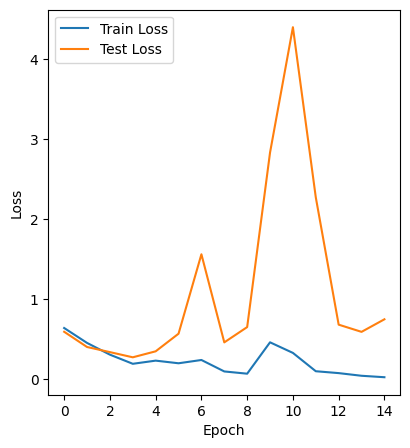

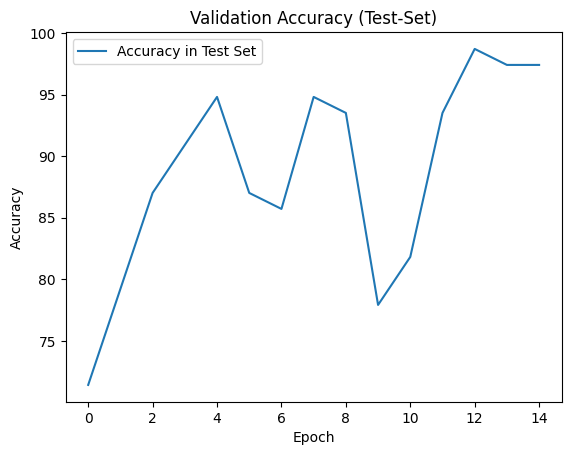

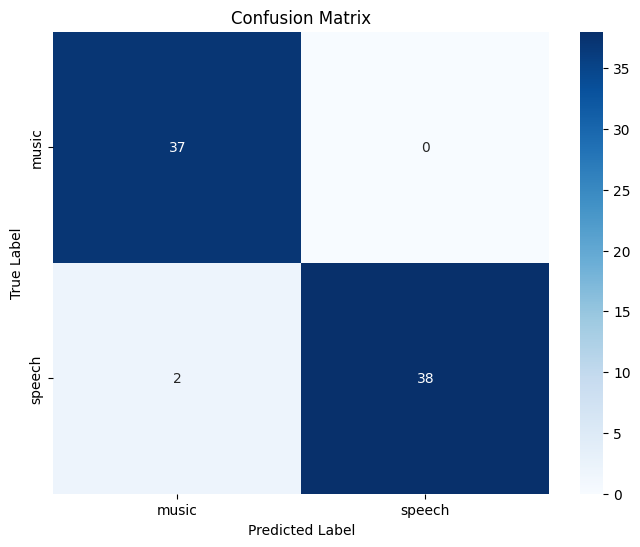

Classification Report-Test:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        37
           1       1.00      0.95      0.97        40

    accuracy                           0.97        77
   macro avg       0.97      0.97      0.97        77
weighted avg       0.98      0.97      0.97        77



In [9]:
def train_and_plot_2(num_epochs, cnn, loaders_cnn):
    train_losses = []
    test_losses = []
    accuracies = []
    confusion_matrices = []

    cnn.train() # set the model in training mode


    classes = ["music", "speech"]  # Set your class labels for confusion matrix display

    for epoch in range(num_epochs): # go through every epoch
        # Training
        train_loss = 0.0
        for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['train']): # go through every patch in the batch, i.e. usually 32 patches per batch
            optimizer.zero_grad() #  reset gradients
            outputs = cnn(patches, loaders_cnn)
            outputs = outputs.squeeze(dim=1)
            loss = loss_func(outputs, labels.float()) # compute the loss
            loss.backward()   # perform backpropagation
            optimizer.step()  # update the model's parameters(weights, bias) based on the optimizer.

            train_loss += loss.item() # accumulates training loss for current epoch

        avg_train_loss = train_loss / len(loaders_cnn['train'])   #average loss ("difference of prediction and true label") per batch in a specific epoch
        train_losses.append(avg_train_loss) # accumulates the average train losses in all batches per epoch

        # Testing

        # set model to evaluation mode and initialize variables  to compute testing metrics, store correct and incorrect predictions.
        cnn.eval()
        test_loss = 0.0
        correct = 0
        total = 0
        correct_info = []
        incorrect_info = []
        # set variables to store true and predicted variables for each epoch
        y_true_epoch = []
        y_pred_epoch = []

        with torch.no_grad(): # disables gradient computation
            for i, (patches, labels, audio_paths) in enumerate(loaders_cnn['test']):
                # compute predictions, loss, and accumulate the testing loss.
                outputs = cnn(patches, loaders_cnn)
                outputs = outputs.squeeze(dim=1)
                loss = loss_func(outputs, labels.float())
                test_loss += loss.item() #loss for each batch

                # calculate number of correct predictions and the total number of predictions for get accurancy.
                predicted = torch.round(outputs) # values less than 0.5 are rounded down to 0 (indicating the negative class, music), and values greater than or equal to 0.5 are rounded up to 1 (indicating the positive class).
                total += labels.size(0) # total number of samples processed per batch
                correct += (predicted == labels).sum().item() # add number of corrected predictions in current batch and add to correct

                # append true and predicted labels for each batch
                y_true_epoch.extend(labels.tolist())
                y_pred_epoch.extend(predicted.tolist())

                # Check for correct and incorrect predictions, tuples containing the indexes, the patches, predicted and true labels and audio paths.
                correct_mask = predicted == labels
                cumulative_batch_size = labels.size(0) * i

                correct_info.extend([(cumulative_batch_size + j, patches[j], predicted[j].item(), labels[j].item(), audio_paths[j]) for j, is_correct in enumerate(correct_mask) if is_correct])
                incorrect_info.extend([(cumulative_batch_size + j, patches[j], predicted[j].item(), labels[j].item(), audio_paths[j]) for j, is_correct in enumerate(correct_mask) if not is_correct])

        avg_test_loss = test_loss / len(loaders_cnn['test'])
        test_losses.append(avg_test_loss)

        accuracy = 100 * correct / total
        accuracies.append(accuracy)

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}, Accuracy in test set: {accuracy:.2f}%")

    # Plotting Train and Test losses
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(test_losses, label='Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Plotting accuracy in Test set
    plt.plot(range(num_epochs), accuracies, label='Accuracy in Test Set')
    plt.title('Validation Accuracy (Test-Set)')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    # Compute and append confusion matrix for the last epoch
    confusion_matrices.append(confusion_matrix(y_true_epoch, y_pred_epoch))

    # Plot the confusion matrix for the last epoch
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrices[-1], annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    # print Classification Report for last epoch
    print("Classification Report-Test:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return correct_info, incorrect_info

#  Call the train_and_plot function
correct_info, incorrect_info = train_and_plot_2(num_epochs, cnn, loaders_cnn)


In [10]:
print(f'number of incorrect predictions : {len(incorrect_info)}'), print(f'number of correct predictions :{len(correct_info)}')

# Count the frequency of 1 and 0 in the second position (predicted values)
count_1 = sum(1 for prediction in incorrect_info if prediction[2] == 1)
count_0 = sum(1 for prediction in incorrect_info if prediction[2] == 0)

# Output the results
print("Frequency of Music (0) predicted wrongly as Speech (1):", count_1)
print("Frequency of Speech (1) predicted wrongly as  Music (0):", count_0)

number of incorrect predictions : 2
number of correct predictions :75
Frequency of Music (0) predicted wrongly as Speech (1): 0
Frequency of Speech (1) predicted wrongly as  Music (0): 2


[24, 37]
0
Patch number/index: 24


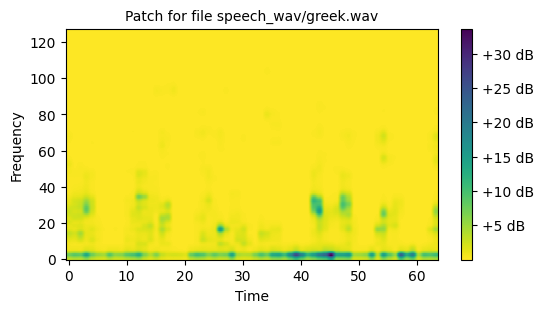

Patch is (0=music, 1=speech): 1
Patch was predicted as (0=music, 1=speech): 0.0
Playing audio for: speech_wav/greek.wav


1
Patch number/index: 37


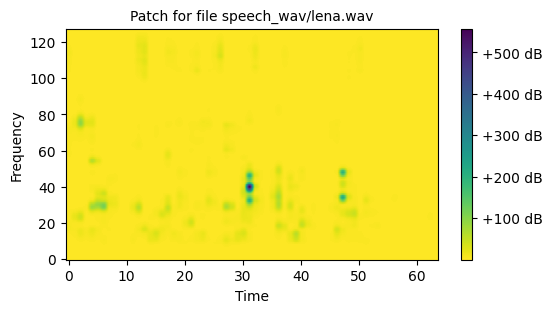

Patch is (0=music, 1=speech): 1
Patch was predicted as (0=music, 1=speech): 0.0
Playing audio for: speech_wav/lena.wav


In [11]:
# saves indices of incorrect and correctly predited patches
patches_correct = [item[0] for item in correct_info]
patches_incorrect = [item[0] for item in incorrect_info]

#print(patches_correct)
print(patches_incorrect)

# Assuming patches_incorrect contains indices

for i, info in enumerate(incorrect_info):
    print(i)
    #print(info)
    print(f"Patch number/index: {info[0]}")
    plt.figure(figsize=(6, 3))
    plt.imshow(info[1][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower')
    audio_path = info[4]
    last_two_hierarchies = "/".join(audio_path.split("/")[-2:])  # Assuming "/" is the path separator, extracts class and filename
    plt.title(f'Patch for file {last_two_hierarchies}', fontsize= 10)
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.colorbar(format='%+2.0f dB')
    plt.show()
    print(f"Patch is (0=music, 1=speech): {info[3]}")
    print(f"Patch was predicted as (0=music, 1=speech): {info[2]}")
    print(f"Playing audio for: {last_two_hierarchies}")
    display(ipd.Audio(info[4]))


In [ ]:
#Save the model after training:

torch.save(cnn.state_dict(), 'inference_model_4CC_sigmoid-PV4-1-2_Relu.pth')


# **Grid search with early stopping to search for best hyperparameters**


*   Uses the last CNN (loaded) from above

*   Given a list of learning rates, search for the best epoch by early stopping in epoch with patience = 5
*   Save the 'best model' with the best hyperparamethers combination for inference



In [ ]:
# Grid search with early stopping for different learning rates:

# Define the hyperparameter grid
#learning_rates_list = [ 0.1, 0.01, 0.008, 0.005]
learning_rates_list = [0.01, 0.008, 0.005]

def train_and_evaluate_cnn(model, loaders_cnn, learning_rate, patience=8):
    loss_func = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    best_accuracy = 0.0
    best_epoch = 0
    no_improvement_count = 0

    train_losses = []
    test_losses = []
    accuracies = []
    confusion_matrices = []

    for epoch in range(1000):  # Set a high value for num_epochs
        # Training
        model.train()
        train_loss = 0.0
        for patches, labels, audio_paths in loaders_cnn['train']:
            optimizer.zero_grad()
            outputs = model(patches,loaders_cnn)
            outputs = outputs.squeeze(dim=1)
            loss = loss_func(outputs, labels.float())
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        avg_train_loss = train_loss / len(loaders_cnn['train'])
        train_losses.append(avg_train_loss)

        # Testing
        model.eval()
        test_loss = 0.0
        correct = 0
        total = 0

        y_true_epoch = []
        y_pred_epoch = []

        with torch.no_grad():
            for patches, labels, audio_paths in loaders_cnn['test']:
                outputs = model(patches, loaders_cnn)
                outputs = outputs.squeeze(dim=1)
                loss = loss_func(outputs, labels.float())
                test_loss += loss.item()

                predicted = torch.round(outputs)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

                y_true_epoch.extend(labels.tolist())
                y_pred_epoch.extend(predicted.tolist())

        avg_test_loss = test_loss / len(loaders_cnn['test'])
        test_losses.append(avg_test_loss)

        accuracy = 100 * correct / total
        accuracies.append(accuracy)

        print(f"Epoch [{epoch}], Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}, Accuracy in test set: {accuracy:.2f}%")

        # Check for early stopping
        if epoch > 0:
            if accuracies[-1] > best_accuracy:
                best_accuracy = accuracies[-1]
                best_epoch = epoch
                no_improvement_count = 0
            else:
                no_improvement_count += 1

            if no_improvement_count >= patience:
                print(f'Early stopping at epoch {epoch}. Best accuracy: {best_accuracy}')
                break

    # Compute and append confusion matrix for the last epoch
    confusion_matrices.append(confusion_matrix(y_true_epoch, y_pred_epoch))

    # Print classification report
    print("Classification Report-Test:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return {
        'best_epoch': best_epoch,
        'best_accuracy': best_accuracy,
        'train_losses': train_losses,
        'test_losses': test_losses,
        'accuracies': accuracies,
        'confusion_matrices': confusion_matrices
    }
import torch

def grid_search(learning_rates_list, loaders_cnn, save_dir='/content'):
    best_accuracy = 0.0
    best_params = None

    for learning_rate in learning_rates_list:

        model = CNN()

        results = train_and_evaluate_cnn(model, loaders_cnn, learning_rate)
        accuracy = results['best_accuracy']

        print(f'Learning Rate: {learning_rate}, Best Accuracy: {accuracy}, Best Epoch: {results["best_epoch"]}')


        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_params = {'learning_rate': learning_rate, 'best_epoch': results["best_epoch"]}

            # Save the model state temporarily in the /content directory
            # model_save_name = f'{save_dir}/model_lr_{learning_rate}_epoch_{results["best_epoch"]}.pth' #
            model_save_name= 'Best_Model.pth'
            torch.save(model.state_dict(), model_save_name)
            #print(f'Model saved at: {model_save_name}')

        print() # blank line
        print("Next hyperparameters:")

    print(f'Best Parameters: {best_params}, Best Accuracy: {best_accuracy}')
    return best_params

# Call grid_search function
best_params = grid_search(learning_rates_list, loaders_cnn)



Epoch [0], Train Loss: 1.0902, Test Loss: 0.6676, Accuracy in test set: 57.14%
Epoch [1], Train Loss: 0.5903, Test Loss: 0.4807, Accuracy in test set: 85.71%
Epoch [2], Train Loss: 0.3725, Test Loss: 0.3437, Accuracy in test set: 87.01%
Epoch [3], Train Loss: 0.2146, Test Loss: 0.2435, Accuracy in test set: 90.91%
Epoch [4], Train Loss: 0.2073, Test Loss: 0.1758, Accuracy in test set: 92.21%
Epoch [5], Train Loss: 0.3942, Test Loss: 1.3119, Accuracy in test set: 84.42%
Epoch [6], Train Loss: 0.2406, Test Loss: 0.3632, Accuracy in test set: 89.61%
Epoch [7], Train Loss: 0.1597, Test Loss: 1.1959, Accuracy in test set: 93.51%
Epoch [8], Train Loss: 0.0957, Test Loss: 1.1678, Accuracy in test set: 94.81%
Epoch [9], Train Loss: 0.1511, Test Loss: 0.2112, Accuracy in test set: 96.10%
Epoch [10], Train Loss: 0.0625, Test Loss: 0.3455, Accuracy in test set: 92.21%
Epoch [11], Train Loss: 0.0389, Test Loss: 1.1258, Accuracy in test set: 94.81%
Epoch [12], Train Loss: 0.0138, Test Loss: 1.1215,

# **4. Inference**


*   Load and process "unseen" validation audio files.
*   Create spectrograms, patches, labels tensors and audio-paths list
*   Load Best CNN model
*   Classification of validation patches









### **Loading all the validation .wavs. and create the patches, labels tensors and the audio-paths lists.**

In [ ]:
# set path to validation wavs:
validation_url = "https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/validation_wav/"

In [ ]:
# 1. Define a transform function to convert audio to a mel spectrogram (same as in data loading notebook)

transform = transforms.Compose([
   torchaudio.transforms.MelSpectrogram(sample_rate=22050, n_fft=400, hop_length=160, n_mels=64), #change the mels because there was an error
   transforms.Resize((128, 128),antialias=True),  # Resize to a fixed size- antialias=True for a warning in future versions
])

# or compute spectrograms using the short-time Fourier transform (STFT)
#transform = Compose([T.Spectrogram(n_fft=400, hop_length=160),transforms.Resize((128, 128)),])# Resize to a fixed size

# 2. Define function to extract patches for all the spectrograms

patch_length = 64 #originally: 64
overlap = 32 #originally: 32 (attention: for no overlap: set to patch_length, overlap = 0 is not allowed, not intuitively: overlap is actually the "step" parameter in "range")

def extract_patches(spectrogram, patch_length=patch_length, overlap=overlap):
    #print (patch_length, overlap, spectrogram.size(2))
    patches = []
    for start in range(0, spectrogram.size(2) - patch_length + 1, overlap): # overlap is not the overlap, but the step!
        end = start + patch_length
        patch = spectrogram[:, :, start:end]
        patches.append(patch)
    return torch.stack(patches, dim=0)

# 3. Defice function to load audios for validation from the Github:  Load the audios and edit audios so they are 0.3 seconds long:
# discard audios shorter than 30 sec and trim the rest to 30 sec.

def load_audio_from_url(file_url, target_duration=30):
    response = requests.get(file_url)
    if response.status_code != 200:
        print(f"Failed to fetch audio file {file_url}. Status code: {response.status_code}")
        return None, None

    try:
        audio_data, sample_rate = torchaudio.load(BytesIO(response.content))

        # Compute the duration of the audio in seconds
        duration = audio_data.size(1) / sample_rate
        #print(f' Audio duration : {duration} sec')
        # Discard audio files shorter than 30 seconds
        if duration < target_duration:
            #print(f"Audio file {file_url} is shorter than 30 seconds. Skipping...")
            return None, None

        # Trim audio files longer than 30 seconds
        if duration > target_duration:
            target_samples = int(target_duration * sample_rate)
            audio_data = audio_data[:, :target_samples]

        return audio_data, sample_rate
    except Exception as e:
        print(f"Error loading audio file {file_url}: {e}")
        return None, None

# Combined function to load audio, convert to spectrograms and create pacthes, and audio_paths, and labels for each spectrograms


def load_gtzan_validation_dataset(validation_url):
    all_patches = []
    all_labels = []
    all_spectrograms = []
    all_audio_paths = []

    # Fixed lists of filenames for each class
    music_filenames = ["music/Music_explose_mono.wav","music/Music_game_mono.wav","music/Music_game_show_mono.wav","music/Music_je_ne_suis_mono.wav","music/Music_lullaby_mono.wav","music/Music_personne_mono.wav","music/Music_sample15_mono.wav","music/Music_sample6_mono.wav","music/Music_societe_mono.wav","music/Music_xmas_mono.wav"]
    speech_filenames = ["speech/Speech_Brasil_mono.wav","speech/Speech_Kaltenbrunner_mono.wav","speech/Speech_OSR_us_000_0012_8k_mono.wav","speech/Speech_OSR_us_000_0015_8k_mono.wav","speech/Speech_OSR_us_000_0035_8k_mono.wav","speech/Speech_OSR_us_000_0039_8k_mono.wav","speech/Speech_OSR_us_000_0060_8k_mono.wav","speech/Speech_Xabier_paya_mono.wav","speech/Speech_bush_mono.wav","speech/Speech_karakhoz_mono.wav","speech/Speech_kvachkov_mono.wav","speech/Speech_marshall_mono.wav","speech/Speech_pershing_mono.wav","speech/Speech_radio1_mono.wav","speech/Speech_radio2_mono.wav","speech/Speech_sandel_mono.wav","speech/Speech_watson_mono.wav"]

    classes = [music_filenames, speech_filenames]
    class_labels = [0, 1]

    for label, filenames in zip(class_labels, classes):
        for filename in filenames:
            file_url = urljoin(validation_url, filename)

            # Load audio file
            audio_data, sample_rate = load_audio_from_url(file_url)
            if audio_data is None:
                continue

            # Apply the defined transform to get the spectrogram
            spectrogram = transform(audio_data)

            # Extract patches
            patches = extract_patches(spectrogram, patch_length=int(patch_length), overlap=int(overlap))

            # Append patches and labels
            if len(patches) > 0:
                all_patches.append(patches)
                all_labels.append(torch.tensor([label] * len(patches)))
                all_spectrograms.append(spectrogram)

                # Append audio path
                all_audio_paths.extend([file_url] * len(patches))

    if not all_patches:
        raise RuntimeError("No valid patches found in the dataset.")

    return (
        torch.cat(all_patches, dim=0),
        torch.cat(all_labels, dim=0),
        torch.stack(all_spectrograms, dim=0),
        all_audio_paths
    )

# Call the function to load the validation dataset
val_patches, val_labels, val_spectrograms, val_audio_paths = load_gtzan_validation_dataset(validation_url)

# Print the shape of the tensors and the tensors
print(f'Patches shape: {val_patches.shape}')
print(f'Labels shape: {val_labels.shape}')
print(f'Spectrograms shape: {val_spectrograms.shape}')
print(f'lenght file paths:{len(val_audio_paths)}')

# Print the first 5 audio paths
print(f'First 5 audio paths: {val_audio_paths[:5]}')


Patches shape: torch.Size([63, 1, 128, 64])
Labels shape: torch.Size([63])
Spectrograms shape: torch.Size([21, 1, 128, 128])
lenght file paths:63
First 5 audio paths: ['https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/validation_wav/music/Music_explose_mono.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/validation_wav/music/Music_explose_mono.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/validation_wav/music/Music_explose_mono.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/validation_wav/music/Music_game_mono.wav', 'https://github.com/Rinderkm/CAS-Github-Project/raw/main/Module_6_Deep_Learning/M6_Project/validation_wav/music/Music_game_mono.wav']



###   **Print few patches and spectrograms to check the validation data processing**







In [ ]:
# print few spectrograms, patches and play audios to check the validation data:

# Select a few indices for visualization (for this code should be called only as positive numbers)
#visualize_indices = (0, 10,15,20)
visualize_indices = (0, 15)
width_ratios = (2,1,1,1)

# Plot the selected spectrograms and corresponding patches
for idx in visualize_indices:
    # Play audio
    audio_path = val_audio_paths[idx*3]
    last_two_hierarchies = "/".join(audio_path.split("/")[-2:])  # Assuming "/" is the path separator, extracts class and filename
    print(f"Playing audio for: {last_two_hierarchies}") #play only the audio of the first pacth
    display(ipd.Audio(audio_path))

    # Plot spectrogram and patches in the same row
    fig, axes = plt.subplots(1, 4, figsize=(30, 6), gridspec_kw={'width_ratios': width_ratios})

    # Plot spectrogram
    axes[0].imshow(val_spectrograms[idx][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower')
    axes[0].set_title(f'Spectrogram for Class {val_labels[idx*3].item()}', fontsize= 22)
    axes[0].set_xlabel('Time',fontsize= 22)
    axes[0].set_ylabel('Frequency',fontsize= 22)
    axes[0].grid(False)
    plt.colorbar(axes[0].imshow(val_spectrograms[idx][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower'), ax=axes[0])

    # Plot patches and play audio (indices of the patches are visualize indices of spectrograms * 3 and + 1,2 or 3 for the 3 patches)
    for i in range(3):
        axes[i+1].imshow(val_patches[idx*3+i][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower')
        axes[i+1].set_title(f'Patch for Class {val_labels[idx*3+i].item()}',fontsize= 22)
        axes[i+1].set_xlabel('Time',fontsize= 22)
        axes[i+1].set_ylabel('Frequency',fontsize= 22)
        axes[i+1].grid(False)
        plt.colorbar(axes[i+1].imshow(val_patches[idx*3+i][0].numpy(), cmap='viridis_r', aspect='auto', origin='lower'), ax=axes[i+1])

    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

### **Load Best model and classify the validation patches**

Probability for patch in file music/Music_explose_mono.wav:
Probability of class 1 (speech): 5.514050586763838e-20
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_explose_mono.wav:
Probability of class 1 (speech): 1.5126468133619397e-10
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_explose_mono.wav:
Probability of class 1 (speech): 6.159135397359425e-29
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_game_mono.wav:
Probability of class 1 (speech): 0.0
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_game_mono.wav:
Probability of class 1 (speech): 0.0
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_game_mono.wav:
Probability of class 1 (speech): 0.0
Audio Patch is predicted as

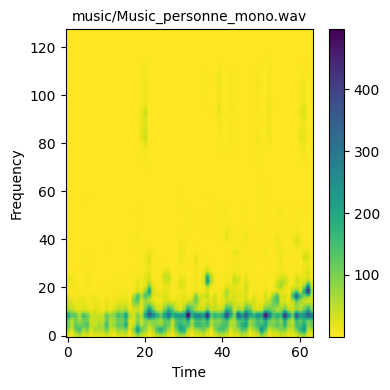

Probability for patch in file music/Music_societe_mono.wav:
Probability of class 1 (speech): 6.814778695541648e-16
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_societe_mono.wav:
Probability of class 1 (speech): 3.7993760042813617e-19
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_societe_mono.wav:
Probability of class 1 (speech): 6.196783027090992e-18
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_xmas_mono.wav:
Probability of class 1 (speech): 6.813622803747421e-06
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_xmas_mono.wav:
Probability of class 1 (speech): 8.742431987229793e-07
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_xmas_mono.wav:
Probability of class 1 (spee

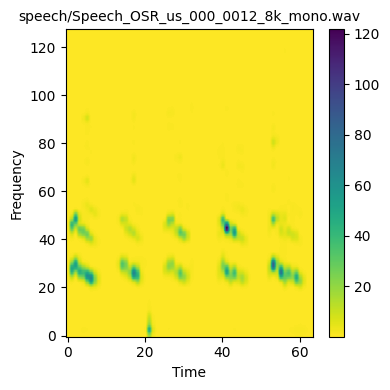

Probability for patch in file speech/Speech_OSR_us_000_0015_8k_mono.wav:
Probability of class 1 (speech): 0.9999972581863403
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0015_8k_mono.wav:
Probability of class 1 (speech): 0.9999966621398926
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0015_8k_mono.wav:
Probability of class 1 (speech): 0.9996256828308105
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0035_8k_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0035_8k_mono.wav:
Probability of class 1 (speech): 0.9999974966049194
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Spe

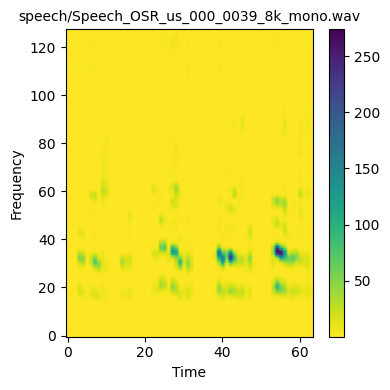

Probability for patch in file speech/Speech_OSR_us_000_0060_8k_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0060_8k_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0060_8k_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_bush_mono.wav:
Probability of class 1 (speech): 0.9999806880950928
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_bush_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_bush_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is pr

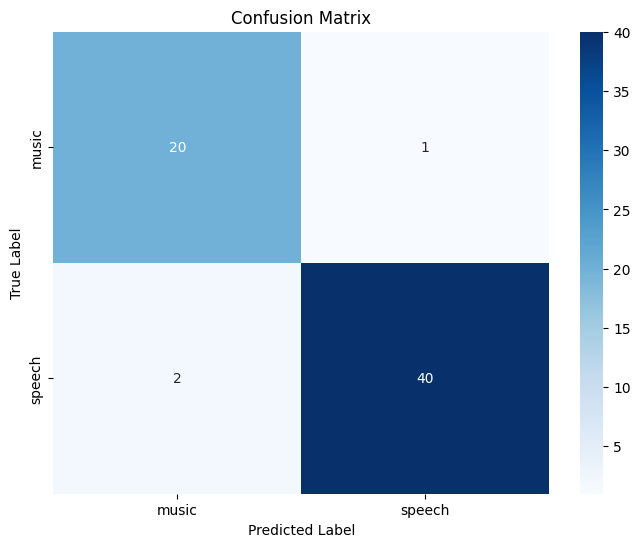


Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.95      0.93        21
           1       0.98      0.95      0.96        42

    accuracy                           0.95        63
   macro avg       0.94      0.95      0.95        63
weighted avg       0.95      0.95      0.95        63



In [ ]:
# load the best model and evaluate the validation patches

def inference(cnn, val_patches, val_labels, val_audio_paths):
    # Load the pre-trained model
    cnn.load_state_dict(torch.load("/content/inference_model_4CC_sigmoid-PV4-1-2_Relu.pth"))
    #cnn.load_state_dict(torch.load("/content/inference_model_4CC_sigmoid_RIM4-1-1.pth"))
    #cnn.load_state_dict(torch.load("/content/inference_model_4CC_sigmoid_PV4-1-2_Tahn.pth"))
    #cnn.load_state_dict(torch.load("/content/Best_Model.pth"))
    cnn.eval()  # Set the model to evaluation model

    predictions = []
    y_true_epoch = []
    y_pred_epoch = []
    incorrect_indices = []  # List to store indices of incorrectly labeled patches

    with torch.no_grad():
        for i, (patches, true_label, audio_path) in enumerate(zip(val_patches, val_labels, val_audio_paths)): # enumerate get the index i
            output = cnn(patches, None)  # Passing None as loaders_cnn

            # Convert probabilities to predictions (speech or music)
            predicted_labels = (output > 0.5).long() # If the output probability is greater than 0.5, it's considered as class 1 (speech), otherwise as class 0 (music). long converst booleand to 0-1 int
            predictions.extend(predicted_labels.tolist())

            # append true and predicted values to a list
            y_true_epoch.append(true_label.item())
            y_pred_epoch.extend(predicted_labels.tolist())

            # extract probability value from the output tensor
            sample_probability = output.item()

            #print probabilities for each patch
            last_two_hierarchies = "/".join(audio_path.split("/")[-2:])  # Extract class and filename
            print(f"Probability for patch in file {last_two_hierarchies}:")
            print(f"Probability of class 1 (speech): {sample_probability}")

            # Print prediction
            if sample_probability < 0.5:
                print('Audio Patch is predicted as Music\n')
            elif sample_probability > 0.5:
                print('Audio Patch is predicted as Speech\n')
            else:
                print('Audio Patch Type cannot be identified\n')

           # Plot the wrongly predicted patches and play the corresponding audios
            if predicted_labels != true_label:  # Check if prediction is incorrect
                incorrect_indices.append(i)  # Store index of incorrect prediction
                print('Audio Patch incorrectly predicted')
                plt.figure(figsize=(4, 4))
                plt.imshow(patches.numpy()[0], cmap='viridis_r', aspect='auto', origin='lower')  # Assuming patches are in the format (batch_size, channels, height, width)
                plt.xlabel('Time',fontsize= 10)
                plt.ylabel('Frequency',fontsize= 10)
                plt.title(last_two_hierarchies, fontsize =10)
                plt.colorbar(plt.imshow(patches.numpy()[0], cmap='viridis_r', aspect='auto', origin='lower'))
                plt.tight_layout()
                plt.show()
                #print(f"Playing audio: {audio_path}")
                #ipd.display(ipd.Audio(audio_path))

            else:
                print('Audio Patch correctly predicted')
                print()
                print()

    # Print confusion matrix and classification report
    print("Confusion Matrix:")
    print(confusion_matrix(y_true_epoch, y_pred_epoch))

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix(y_true_epoch, y_pred_epoch), annot=True, fmt='d', cmap='Blues', xticklabels=["music", "speech"], yticklabels=["music", "speech"])
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    print("\nClassification Report:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return incorrect_indices

cnn = CNN()  # Instantiate your CNN model, make sure the cnn from where the model is saved is the last run
incorrect_indices = inference(cnn, val_patches, val_labels, val_audio_paths)

In [ ]:

# play separatelly incorrectly predicted audios:
# Extract filenames from file paths

file_names = [os.path.basename(path) for path in val_audio_paths]

for i in incorrect_indices:

        print(f"Playing audio: {file_names[i]}")
        ipd.display(ipd.Audio(val_audio_paths[i]))
# still is truncating because of an error:
# Buffered data was truncated after reaching the output size limit.

Output hidden; open in https://colab.research.google.com to view.

# **Back-up code**

### **Gridsearch for best hyperparameters**

*   Uses the last CNN defined (loaded) from above
*   searches for best epochs and learning_rate combination




In [ ]:
# Define the hyperparameter grid
epochs_list = [5, 8, 12]
learning_rates_list = [0.001, 0.005, 0.008]

In [ ]:
# Gridsearch for hyperparameters (epochs, learning_rate)

loaders_cnn = copy.deepcopy(loaders) # we get loaders_cnn from the saved original loaders that we do not pass to the Cnn

def train_and_evaluate_cnn(model, loaders_cnn, num_epochs, learning_rate):
    loss_func = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    train_losses = []
    test_losses = []
    accuracies = []
    confusion_matrices = []

    for epoch in range(num_epochs):
        # Training
        model.train()
        train_loss = 0.0
        for patches, labels, audio_paths in loaders_cnn['train']:
            optimizer.zero_grad()
            outputs = model(patches, loaders_cnn)
            outputs = outputs.squeeze(dim=1)
            loss = loss_func(outputs, labels.float())
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        avg_train_loss = train_loss / len(loaders_cnn['train'])
        train_losses.append(avg_train_loss)

        # Testing
        model.eval()
        test_loss = 0.0
        correct = 0
        total = 0

        y_true_epoch = []
        y_pred_epoch = []

        with torch.no_grad():
            for patches, labels, audio_paths in loaders_cnn['test']:
                outputs = model(patches, loaders_cnn)
                outputs = outputs.squeeze(dim=1)
                loss = loss_func(outputs, labels.float())
                test_loss += loss.item()

                predicted = torch.round(outputs)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

                y_true_epoch.extend(labels.tolist())
                y_pred_epoch.extend(predicted.tolist())

        avg_test_loss = test_loss / len(loaders_cnn['test'])
        test_losses.append(avg_test_loss)

        accuracy = 100 * correct / total
        accuracies.append(accuracy)

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}, Accuracy in test set: {accuracy:.2f}%")

    # Compute and append confusion matrix for the last epoch
    confusion_matrices.append(confusion_matrix(y_true_epoch, y_pred_epoch))

    # Print classification report
    print("Classification Report-Test:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return {
        'train_losses': train_losses,
        'test_losses': test_losses,
        'accuracies': accuracies,
        'confusion_matrices': confusion_matrices
    }

def grid_search(epochs_list, learning_rates_list, loaders_cnn):
    best_accuracy = 0.0
    best_params = None

    for num_epochs, learning_rate in product(epochs_list, learning_rates_list):
        model = CNN()

        results = train_and_evaluate_cnn(model, loaders_cnn, num_epochs, learning_rate)
        accuracy = results['accuracies'][-1]

        print(f'Epochs: {num_epochs}, Learning Rate: {learning_rate}, Final Accuracy: {accuracy}')
        print() # blank line
        print("next hyperparameters:")

        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_params = {'num_epochs': num_epochs, 'learning_rate': learning_rate}

    print(f'Best Parameters: {best_params}, Best Accuracy: {best_accuracy}')
    return best_params

# Call grid_search function
best_params = grid_search(epochs_list, learning_rates_list, loaders_cnn)


Epoch [1/5], Train Loss: 0.6584, Test Loss: 0.6144, Accuracy in test set: 62.34%
Epoch [2/5], Train Loss: 0.5203, Test Loss: 0.6377, Accuracy in test set: 70.13%
Epoch [3/5], Train Loss: 0.3782, Test Loss: 0.7603, Accuracy in test set: 66.23%
Epoch [4/5], Train Loss: 0.3194, Test Loss: 0.4298, Accuracy in test set: 84.42%
Epoch [5/5], Train Loss: 0.2281, Test Loss: 0.4432, Accuracy in test set: 84.42%
Classification Report-Test:
              precision    recall  f1-score   support

           0       0.82      0.86      0.84        37
           1       0.87      0.82      0.85        40

    accuracy                           0.84        77
   macro avg       0.84      0.84      0.84        77
weighted avg       0.85      0.84      0.84        77

Epochs: 5, Learning Rate: 0.001, Final Accuracy: 84.41558441558442

next hyperparameters:
Epoch [1/5], Train Loss: 0.6712, Test Loss: 0.6037, Accuracy in test set: 61.04%
Epoch [2/5], Train Loss: 0.4872, Test Loss: 0.4654, Accuracy in test 

## **Run other models inference**

Probability for patch in file music/Music_explose_mono.wav:
Probability of class 1 (speech): 7.290046542269768e-25
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_explose_mono.wav:
Probability of class 1 (speech): 2.3386753744712822e-26
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_explose_mono.wav:
Probability of class 1 (speech): 8.886393032238934e-29
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_game_mono.wav:
Probability of class 1 (speech): 0.0
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_game_mono.wav:
Probability of class 1 (speech): 0.0
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_game_mono.wav:
Probability of class 1 (speech): 0.0
Audio Patch is predicted as

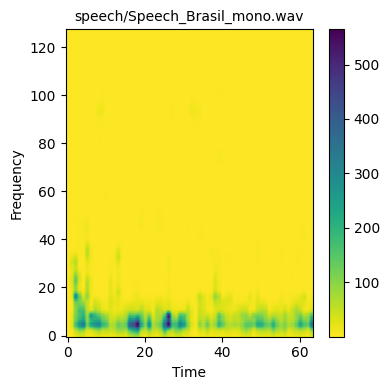

Probability for patch in file speech/Speech_Brasil_mono.wav:
Probability of class 1 (speech): 6.260273926089114e-24
Audio Patch is predicted as Music

Audio Patch incorrectly predicted


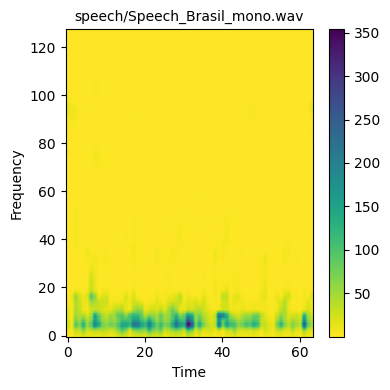

Probability for patch in file speech/Speech_Brasil_mono.wav:
Probability of class 1 (speech): 3.9910896703077015e-06
Audio Patch is predicted as Music

Audio Patch incorrectly predicted


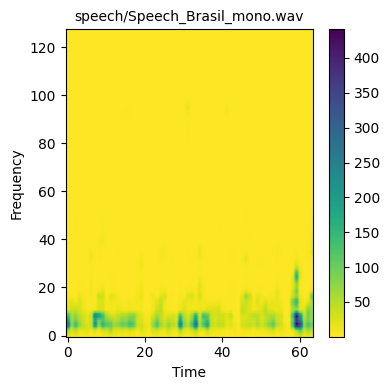

Probability for patch in file speech/Speech_Kaltenbrunner_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_Kaltenbrunner_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_Kaltenbrunner_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0012_8k_mono.wav:
Probability of class 1 (speech): 0.9999743700027466
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0012_8k_mono.wav:
Probability of class 1 (speech): 0.999985933303833
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0012_8k_mono.wav:
Probability o

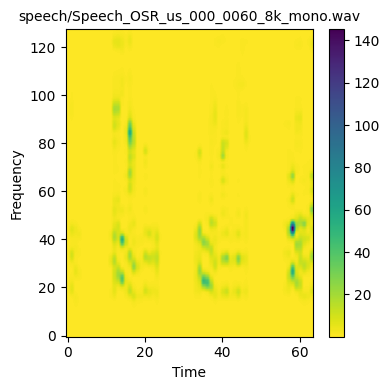

Probability for patch in file speech/Speech_bush_mono.wav:
Probability of class 1 (speech): 0.9999978542327881
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_bush_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_bush_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_karakhoz_mono.wav:
Probability of class 1 (speech): 0.9940398931503296
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_karakhoz_mono.wav:
Probability of class 1 (speech): 0.009919606149196625
Audio Patch is predicted as Music

Audio Patch incorrectly predicted


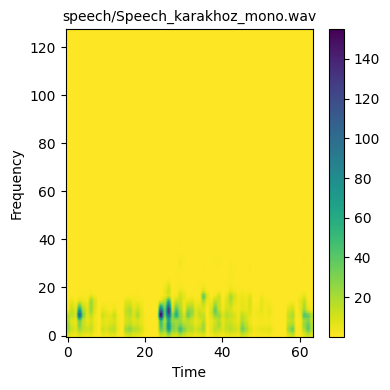

Probability for patch in file speech/Speech_karakhoz_mono.wav:
Probability of class 1 (speech): 0.0002556108229327947
Audio Patch is predicted as Music

Audio Patch incorrectly predicted


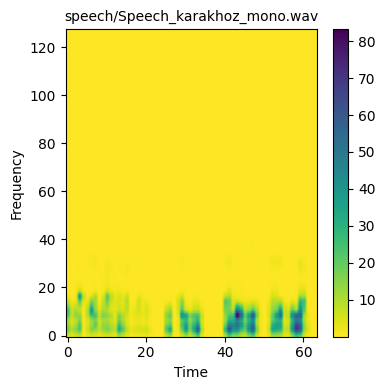

Probability for patch in file speech/Speech_kvachkov_mono.wav:
Probability of class 1 (speech): 0.9999352693557739
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_kvachkov_mono.wav:
Probability of class 1 (speech): 0.9999839067459106
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_kvachkov_mono.wav:
Probability of class 1 (speech): 0.9592342376708984
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_pershing_mono.wav:
Probability of class 1 (speech): 0.999652624130249
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_pershing_mono.wav:
Probability of class 1 (speech): 0.9989664554595947
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_pershing_mono.wav:
Probability o

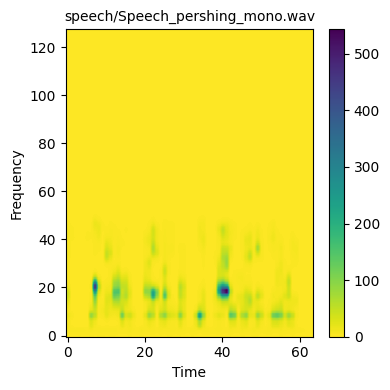

Probability for patch in file speech/Speech_radio1_mono.wav:
Probability of class 1 (speech): 0.7621420621871948
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_radio1_mono.wav:
Probability of class 1 (speech): 0.8729803562164307
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_radio1_mono.wav:
Probability of class 1 (speech): 0.8103784918785095
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_radio2_mono.wav:
Probability of class 1 (speech): 0.6576586961746216
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_radio2_mono.wav:
Probability of class 1 (speech): 0.9673551917076111
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_radio2_mono.wav:
Probability of class 1 (

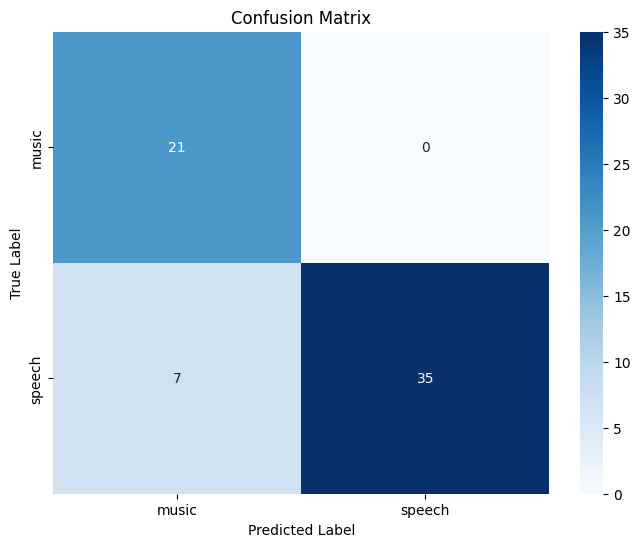


Classification Report:
              precision    recall  f1-score   support

           0       0.75      1.00      0.86        21
           1       1.00      0.83      0.91        42

    accuracy                           0.89        63
   macro avg       0.88      0.92      0.88        63
weighted avg       0.92      0.89      0.89        63



In [ ]:
# load the best model and evaluate the validation patches

def inference(cnn, val_patches, val_labels, val_audio_paths):
    # Load the pre-trained model
    #cnn.load_state_dict(torch.load("/content/inference_model_4CC_sigmoid-PV4-1-2_Relu.pth"))
    cnn.load_state_dict(torch.load("/content/inference_model_4CC_sigmoid_RIM4-1-1.pth"))
    #cnn.load_state_dict(torch.load("/content/inference_model_4CC_sigmoid_PV4-1-2_Tahn.pth"))
    #cnn.load_state_dict(torch.load("/content/Best_Model.pth"))
    cnn.eval()  # Set the model to evaluation model

    predictions = []
    y_true_epoch = []
    y_pred_epoch = []
    incorrect_indices = []  # List to store indices of incorrectly labeled patches

    with torch.no_grad():
        for i, (patches, true_label, audio_path) in enumerate(zip(val_patches, val_labels, val_audio_paths)):
            output = cnn(patches, None)  # Passing None as loaders_cnn

            # Convert probabilities to predictions (speech or music)
            predicted_labels = (output > 0.5).long()
            predictions.extend(predicted_labels.tolist())

            y_true_epoch.append(true_label.item())
            y_pred_epoch.extend(predicted_labels.tolist())


            sample_probability = output.item()

            last_two_hierarchies = "/".join(audio_path.split("/")[-2:])  # Extract class and filename
            print(f"Probability for patch in file {last_two_hierarchies}:")
            print(f"Probability of class 1 (speech): {sample_probability}")

            # Print prediction
            if sample_probability < 0.5:
                print('Audio Patch is predicted as Music\n')
            elif sample_probability > 0.5:
                print('Audio Patch is predicted as Speech\n')
            else:
                print('Audio Patch Type cannot be identified\n')

           # Plot the wrongly predicted patches and play the corresponding audios
            if predicted_labels != true_label:  # Check if prediction is incorrect
                incorrect_indices.append(i)  # Store index of incorrect prediction
                print('Audio Patch incorrectly predicted')
                plt.figure(figsize=(4, 4))
                plt.imshow(patches.numpy()[0], cmap='viridis_r', aspect='auto', origin='lower')  # Assuming patches are in the format (batch_size, channels, height, width)
                plt.xlabel('Time',fontsize= 10)
                plt.ylabel('Frequency',fontsize= 10)
                plt.title(last_two_hierarchies, fontsize =10)
                plt.colorbar(plt.imshow(patches.numpy()[0], cmap='viridis_r', aspect='auto', origin='lower'))
                plt.tight_layout()
                plt.show()
                #print(f"Playing audio: {audio_path}")
                #ipd.display(ipd.Audio(audio_path))

            else:
                print('Audio Patch correctly predicted')
                print()
                print()
    # Print confusion matrix and classification report
    print("Confusion Matrix:")
    print(confusion_matrix(y_true_epoch, y_pred_epoch))

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix(y_true_epoch, y_pred_epoch), annot=True, fmt='d', cmap='Blues', xticklabels=["music", "speech"], yticklabels=["music", "speech"])
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    print("\nClassification Report:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return incorrect_indices

cnn = CNN()  # Instantiate your CNN model, make sure the cnn from where the model is saved is the last run
incorrect_indices = inference(cnn, val_patches, val_labels, val_audio_paths)

In [ ]:
# play separatelly incorrectly predicted audios:
# Extract filenames from file paths

file_names = [os.path.basename(path) for path in val_audio_paths]

for i in incorrect_indices:

        print(f"Playing audio: {file_names[i]}")
        ipd.display(ipd.Audio(val_audio_paths[i]))

Output hidden; open in https://colab.research.google.com to view.

Probability for patch in file music/Music_explose_mono.wav:
Probability of class 1 (speech): 1.0620154321369128e-24
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_explose_mono.wav:
Probability of class 1 (speech): 1.7151823581210146e-13
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_explose_mono.wav:
Probability of class 1 (speech): 5.531599171335659e-28
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_game_mono.wav:
Probability of class 1 (speech): 0.0
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_game_mono.wav:
Probability of class 1 (speech): 0.0
Audio Patch is predicted as Music

Audio Patch correctly predicted


Probability for patch in file music/Music_game_mono.wav:
Probability of class 1 (speech): 0.0
Audio Patch is predicted a

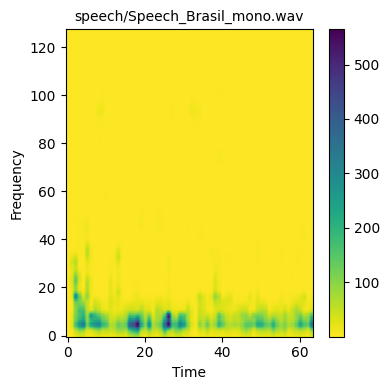

Probability for patch in file speech/Speech_Brasil_mono.wav:
Probability of class 1 (speech): 1.8144903636016738e-18
Audio Patch is predicted as Music

Audio Patch incorrectly predicted


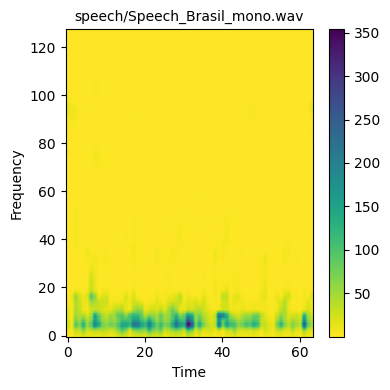

Probability for patch in file speech/Speech_Brasil_mono.wav:
Probability of class 1 (speech): 0.9999980926513672
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_Kaltenbrunner_mono.wav:
Probability of class 1 (speech): 0.9995476603507996
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_Kaltenbrunner_mono.wav:
Probability of class 1 (speech): 0.00012042573507642373
Audio Patch is predicted as Music

Audio Patch incorrectly predicted


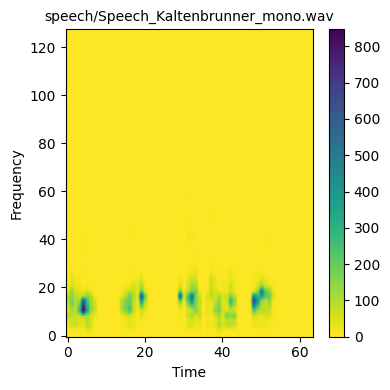

Probability for patch in file speech/Speech_Kaltenbrunner_mono.wav:
Probability of class 1 (speech): 2.269705244869514e-20
Audio Patch is predicted as Music

Audio Patch incorrectly predicted


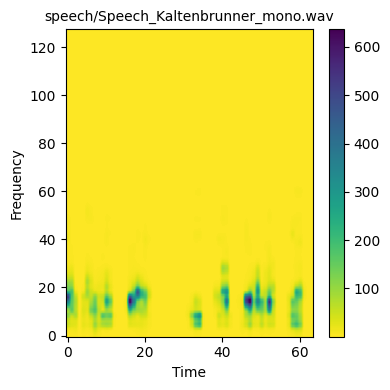

Probability for patch in file speech/Speech_OSR_us_000_0012_8k_mono.wav:
Probability of class 1 (speech): 4.868899122811854e-05
Audio Patch is predicted as Music

Audio Patch incorrectly predicted


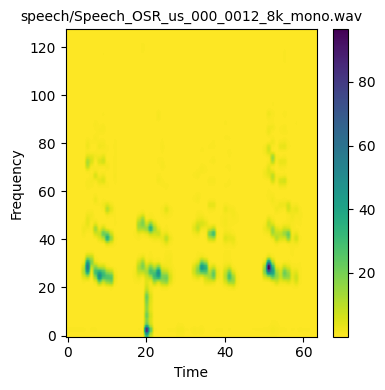

Probability for patch in file speech/Speech_OSR_us_000_0012_8k_mono.wav:
Probability of class 1 (speech): 0.9999959468841553
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0012_8k_mono.wav:
Probability of class 1 (speech): 0.02354271337389946
Audio Patch is predicted as Music

Audio Patch incorrectly predicted


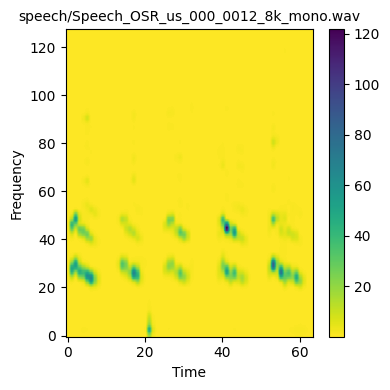

Probability for patch in file speech/Speech_OSR_us_000_0015_8k_mono.wav:
Probability of class 1 (speech): 0.9999858140945435
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0015_8k_mono.wav:
Probability of class 1 (speech): 0.9996187686920166
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0015_8k_mono.wav:
Probability of class 1 (speech): 0.9963598847389221
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0035_8k_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_0035_8k_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_OSR_us_000_

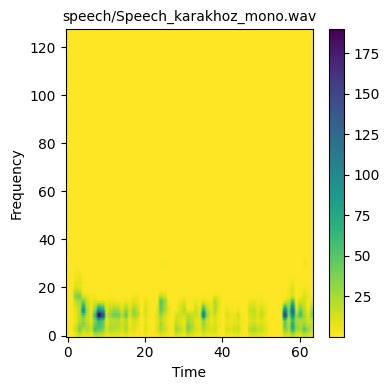

Probability for patch in file speech/Speech_karakhoz_mono.wav:
Probability of class 1 (speech): 3.1217002316452636e-08
Audio Patch is predicted as Music

Audio Patch incorrectly predicted


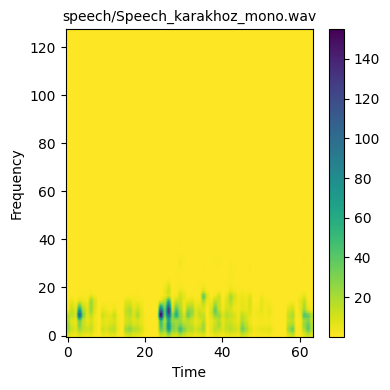

Probability for patch in file speech/Speech_karakhoz_mono.wav:
Probability of class 1 (speech): 8.765500751906075e-06
Audio Patch is predicted as Music

Audio Patch incorrectly predicted


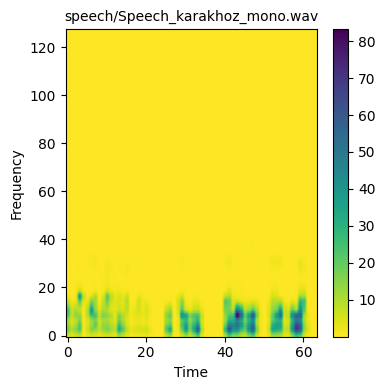

Probability for patch in file speech/Speech_kvachkov_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_kvachkov_mono.wav:
Probability of class 1 (speech): 0.7037200331687927
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_kvachkov_mono.wav:
Probability of class 1 (speech): 0.16281534731388092
Audio Patch is predicted as Music

Audio Patch incorrectly predicted


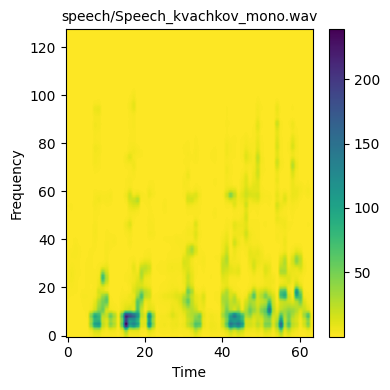

Probability for patch in file speech/Speech_pershing_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_pershing_mono.wav:
Probability of class 1 (speech): 0.9999998807907104
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_pershing_mono.wav:
Probability of class 1 (speech): 1.0
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_radio1_mono.wav:
Probability of class 1 (speech): 0.7409726977348328
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_radio1_mono.wav:
Probability of class 1 (speech): 0.6913939118385315
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_radio1_mono.wav:
Probability of class 1 (speech): 0.7334651350975

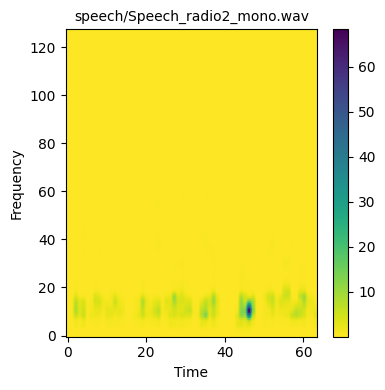

Probability for patch in file speech/Speech_radio2_mono.wav:
Probability of class 1 (speech): 0.07322715222835541
Audio Patch is predicted as Music

Audio Patch incorrectly predicted


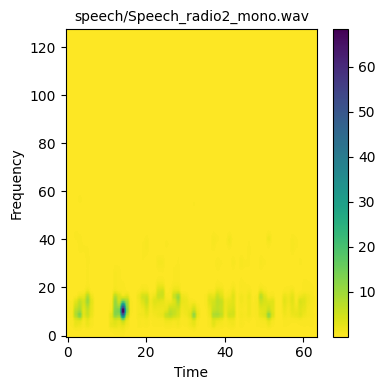

Probability for patch in file speech/Speech_watson_mono.wav:
Probability of class 1 (speech): 0.9999986886978149
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_watson_mono.wav:
Probability of class 1 (speech): 0.8076978921890259
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Probability for patch in file speech/Speech_watson_mono.wav:
Probability of class 1 (speech): 0.9998549222946167
Audio Patch is predicted as Speech

Audio Patch correctly predicted


Confusion Matrix:
[[21  0]
 [12 30]]


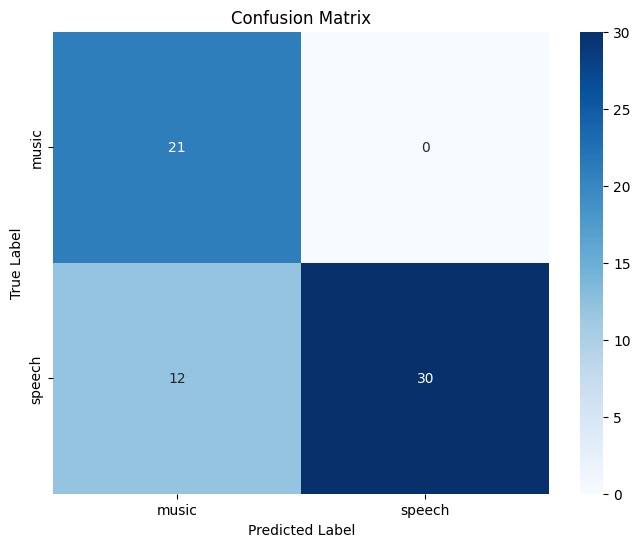


Classification Report:
              precision    recall  f1-score   support

           0       0.64      1.00      0.78        21
           1       1.00      0.71      0.83        42

    accuracy                           0.81        63
   macro avg       0.82      0.86      0.81        63
weighted avg       0.88      0.81      0.81        63



In [ ]:
# load the best model and evaluate the validation patches

def inference(cnn, val_patches, val_labels, val_audio_paths):
    # Load the pre-trained model
    #cnn.load_state_dict(torch.load("/content/inference_model_4CC_sigmoid-PV4-1-2_Relu.pth"))
    #cnn.load_state_dict(torch.load("/content/inference_model_4CC_sigmoid_RIM4-1-1.pth"))
    #cnn.load_state_dict(torch.load("/content/inference_model_4CC_sigmoid_PV4-1-2_Tahn.pth"))
    cnn.load_state_dict(torch.load("/content/Best_Model.pth"))
    cnn.eval()  # Set the model to evaluation model

    predictions = []
    y_true_epoch = []
    y_pred_epoch = []
    incorrect_indices = []  # List to store indices of incorrectly labeled patches

    with torch.no_grad():
        for i, (patches, true_label, audio_path) in enumerate(zip(val_patches, val_labels, val_audio_paths)):
            output = cnn(patches, None)  # Passing None as loaders_cnn

            # Convert probabilities to predictions (speech or music)
            predicted_labels = (output > 0.5).long()
            predictions.extend(predicted_labels.tolist())

            y_true_epoch.append(true_label.item())
            y_pred_epoch.extend(predicted_labels.tolist())


            sample_probability = output.item()

            last_two_hierarchies = "/".join(audio_path.split("/")[-2:])  # Extract class and filename
            print(f"Probability for patch in file {last_two_hierarchies}:")
            print(f"Probability of class 1 (speech): {sample_probability}")

            # Print prediction
            if sample_probability < 0.5:
                print('Audio Patch is predicted as Music\n')
            elif sample_probability > 0.5:
                print('Audio Patch is predicted as Speech\n')
            else:
                print('Audio Patch Type cannot be identified\n')

           # Plot the wrongly predicted patches and play the corresponding audios
            if predicted_labels != true_label:  # Check if prediction is incorrect
                incorrect_indices.append(i)  # Store index of incorrect prediction
                print('Audio Patch incorrectly predicted')
                plt.figure(figsize=(4, 4))
                plt.imshow(patches.numpy()[0], cmap='viridis_r', aspect='auto', origin='lower')  # Assuming patches are in the format (batch_size, channels, height, width)
                plt.xlabel('Time',fontsize= 10)
                plt.ylabel('Frequency',fontsize= 10)
                plt.title(last_two_hierarchies, fontsize =10)
                plt.colorbar(plt.imshow(patches.numpy()[0], cmap='viridis_r', aspect='auto', origin='lower'))
                plt.tight_layout()
                plt.show()
                #print(f"Playing audio: {audio_path}")
                #ipd.display(ipd.Audio(audio_path))

            else:
                print('Audio Patch correctly predicted')
                print()
                print()
    # Print confusion matrix and classification report
    print("Confusion Matrix:")
    print(confusion_matrix(y_true_epoch, y_pred_epoch))

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix(y_true_epoch, y_pred_epoch), annot=True, fmt='d', cmap='Blues', xticklabels=["music", "speech"], yticklabels=["music", "speech"])
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    print("\nClassification Report:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return incorrect_indices

cnn = CNN()  # Instantiate your CNN model, make sure the cnn from where the model is saved is the last run
incorrect_indices = inference(cnn, val_patches, val_labels, val_audio_paths)

In [ ]:
# play separatelly incorrectly predicted audios:
# Extract filenames from file paths

file_names = [os.path.basename(path) for path in val_audio_paths]

for i in incorrect_indices:

        print(f"Playing audio: {file_names[i]}")
        ipd.display(ipd.Audio(val_audio_paths[i]))



Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# load the best model and evaluate the validation patches

def inference(cnn, val_patches, val_labels, val_audio_paths):
    # Load the pre-trained model
    #cnn.load_state_dict(torch.load("/content/inference_model_4CC_sigmoid-PV4-1-2_Relu.pth"))
    #cnn.load_state_dict(torch.load("/content/inference_model_4CC_sigmoid_RIM4-1-1.pth"))
    cnn.load_state_dict(torch.load("/content/inference_model_4CC_sigmoid_PV4-1-2_Tahn.pth"))
    #cnn.load_state_dict(torch.load("/content/Best_Model.pth"))
    cnn.eval()  # Set the model to evaluation model

    predictions = []
    y_true_epoch = []
    y_pred_epoch = []
    incorrect_indices = []  # List to store indices of incorrectly labeled patches

    with torch.no_grad():
        for i, (patches, true_label, audio_path) in enumerate(zip(val_patches, val_labels, val_audio_paths)):
            output = cnn(patches, None)  # Passing None as loaders_cnn

            # Convert probabilities to predictions (speech or music)
            predicted_labels = (output > 0.5).long()
            predictions.extend(predicted_labels.tolist())

            y_true_epoch.append(true_label.item())
            y_pred_epoch.extend(predicted_labels.tolist())


            sample_probability = output.item()

            last_two_hierarchies = "/".join(audio_path.split("/")[-2:])  # Extract class and filename
            print(f"Probability for patch in file {last_two_hierarchies}:")
            print(f"Probability of class 1 (speech): {sample_probability}")

            # Print prediction
            if sample_probability < 0.5:
                print('Audio Patch is predicted as Music\n')
            elif sample_probability > 0.5:
                print('Audio Patch is predicted as Speech\n')
            else:
                print('Audio Patch Type cannot be identified\n')

           # Plot the wrongly predicted patches and play the corresponding audios
            if predicted_labels != true_label:  # Check if prediction is incorrect
                incorrect_indices.append(i)  # Store index of incorrect prediction
                print('Audio Patch incorrectly predicted')
                plt.figure(figsize=(4, 4))
                plt.imshow(patches.numpy()[0], cmap='viridis_r', aspect='auto', origin='lower')  # Assuming patches are in the format (batch_size, channels, height, width)
                plt.xlabel('Time',fontsize= 10)
                plt.ylabel('Frequency',fontsize= 10)
                plt.title(last_two_hierarchies, fontsize =10)
                plt.colorbar(plt.imshow(patches.numpy()[0], cmap='viridis_r', aspect='auto', origin='lower'))
                plt.tight_layout()
                plt.show()
                #print(f"Playing audio: {audio_path}")
                #ipd.display(ipd.Audio(audio_path))

            else:
                print('Audio Patch correctly predicted')
                print()
                print()
    # Print confusion matrix and classification report
    print("Confusion Matrix:")
    print(confusion_matrix(y_true_epoch, y_pred_epoch))

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix(y_true_epoch, y_pred_epoch), annot=True, fmt='d', cmap='Blues', xticklabels=["music", "speech"], yticklabels=["music", "speech"])
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    print("\nClassification Report:")
    print(classification_report(y_true_epoch, y_pred_epoch))

    return incorrect_indices

cnn = CNN()  # Instantiate your CNN model, make sure the cnn from where the model is saved is the last run
incorrect_indices = inference(cnn, val_patches, val_labels, val_audio_paths)

Output hidden; open in https://colab.research.google.com to view.